In [4]:
import os
from PIL import Image
import torch

In [5]:
import os

# List the contents of the 'trace-tumor-notebook' directory
extracted_dir = '/kaggle/input/trace-tumor-notebook/'
print(os.listdir(extracted_dir))

['val', 'test', 'train']


In [6]:
# Paths to the train, val, and test directories
train_dir = os.path.join(extracted_dir, 'train')
val_dir = os.path.join(extracted_dir, 'val')
test_dir = os.path.join(extracted_dir, 'test')

# List contents of the train, val, and test directories
print(f"Train directory contents: {os.listdir(train_dir)}")
print(f"Validation directory contents: {os.listdir(val_dir)}")
print(f"Test directory contents: {os.listdir(test_dir)}")

Train directory contents: ['Benign', 'Malignant']
Validation directory contents: ['Benign', 'Malignant']
Test directory contents: ['Benign', 'Malignant']


In [7]:
from torch.utils.data import Dataset

class CustomImageDataset(Dataset):
    def __init__(self, root_dir):
        self.root_dir = root_dir
        self.image_paths = []
        self.labels = []
        valid_extensions = ('.jpg', '.jpeg', '.png', '.bmp')  

        
        def find_images(path, label):
            for entry in os.listdir(path):
                entry_path = os.path.join(path, entry)
                if os.path.isdir(entry_path):
                    find_images(entry_path, label)  
                elif os.path.isfile(entry_path) and entry_path.lower().endswith(valid_extensions):
                    self.image_paths.append(entry_path)
                    self.labels.append(label)  

       
        for class_dir in os.listdir(root_dir):
            class_path = os.path.join(root_dir, class_dir)
            if os.path.isdir(class_path):
                find_images(class_path, class_dir) 

        #  Print loaded image paths
        print("Loaded image paths:")
        for path in self.image_paths:
            print(path)

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        image = Image.open(img_path).convert('RGB')  # Ensure the image is in RGB format
        return image, self.labels[idx]

#  datasets without transformations
train_dataset = CustomImageDataset(root_dir='/kaggle/input/trace-tumor-notebook/train')
val_dataset = CustomImageDataset(root_dir='/kaggle/input/trace-tumor-notebook/val')
test_dataset = CustomImageDataset(root_dir='/kaggle/input/trace-tumor-notebook/test')


Loaded image paths:
/kaggle/input/trace-tumor-notebook/train/Benign/BreaDM-Be-1820/SUB3/p-042.jpg
/kaggle/input/trace-tumor-notebook/train/Benign/BreaDM-Be-1820/SUB3/p-040.jpg
/kaggle/input/trace-tumor-notebook/train/Benign/BreaDM-Be-1820/SUB3/p-039.jpg
/kaggle/input/trace-tumor-notebook/train/Benign/BreaDM-Be-1820/SUB3/p-033.jpg
/kaggle/input/trace-tumor-notebook/train/Benign/BreaDM-Be-1820/SUB3/p-041.jpg
/kaggle/input/trace-tumor-notebook/train/Benign/BreaDM-Be-1820/SUB3/p-032.jpg
/kaggle/input/trace-tumor-notebook/train/Benign/BreaDM-Be-1820/SUB3/p-038.jpg
/kaggle/input/trace-tumor-notebook/train/Benign/BreaDM-Be-1820/SUB3/p-029.jpg
/kaggle/input/trace-tumor-notebook/train/Benign/BreaDM-Be-1820/SUB3/p-031.jpg
/kaggle/input/trace-tumor-notebook/train/Benign/BreaDM-Be-1820/SUB3/p-030.jpg
/kaggle/input/trace-tumor-notebook/train/Benign/BreaDM-Be-1820/SUB3/p-034.jpg
/kaggle/input/trace-tumor-notebook/train/Benign/BreaDM-Be-1820/SUB3/p-036.jpg
/kaggle/input/trace-tumor-notebook/train/Ben

In [6]:
print(f"Number of training images: {len(train_dataset)}")
print(f"Number of validation images: {len(val_dataset)}")
print(f"Number of test images: {len(test_dataset)}")

Number of training images: 20434
Number of validation images: 1989
Number of test images: 6851


In [7]:
from collections import Counter
image_sizes = [Image.open(img_path).size for img_path in train_dataset.image_paths]
print(Counter(image_sizes))

Counter({(27, 26): 527, (26, 21): 510, (20, 24): 442, (27, 24): 374, (34, 34): 357, (43, 43): 340, (46, 37): 323, (39, 66): 323, (27, 28): 323, (34, 32): 323, (16, 14): 272, (24, 32): 272, (15, 14): 272, (44, 75): 272, (33, 31): 272, (14, 12): 255, (29, 27): 255, (25, 29): 255, (25, 30): 255, (56, 52): 238, (21, 24): 238, (25, 18): 238, (28, 18): 238, (28, 30): 238, (33, 37): 238, (17, 19): 238, (17, 14): 221, (16, 13): 221, (44, 36): 221, (42, 39): 221, (41, 61): 221, (49, 39): 221, (49, 49): 221, (30, 25): 221, (24, 26): 204, (19, 21): 204, (25, 32): 204, (15, 15): 187, (32, 38): 187, (20, 18): 187, (26, 30): 187, (23, 21): 187, (17, 15): 170, (20, 26): 170, (28, 28): 170, (35, 26): 170, (18, 18): 170, (36, 34): 170, (37, 40): 170, (13, 12): 153, (34, 27): 153, (19, 19): 153, (23, 18): 153, (30, 27): 153, (17, 17): 153, (12, 14): 153, (23, 42): 153, (35, 32): 153, (31, 20): 136, (23, 28): 136, (28, 33): 136, (24, 30): 136, (25, 22): 136, (24, 34): 136, (32, 36): 136, (26, 20): 136, (

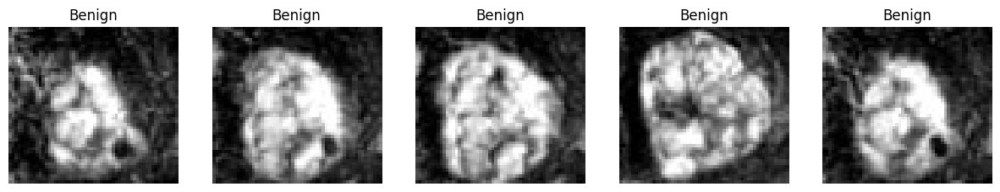

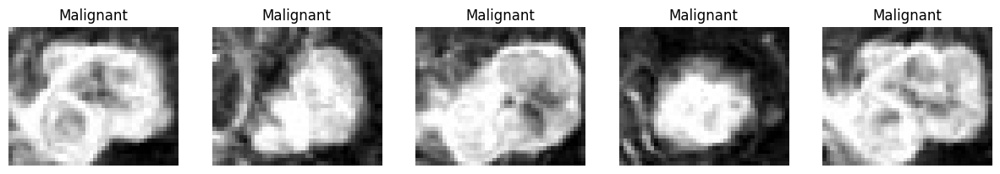

In [8]:
import matplotlib.pyplot as plt
import numpy as np

def show_images_by_class(dataset, class_name, num_images=5):
    plt.figure(figsize=(15, 5))
    count = 0

    for i in range(len(dataset)):
        img, label = dataset[i]
        
        # PIL Image to NumPy 
        img = np.array(img) / 255.0  
        if label == class_name:  
            plt.subplot(1, num_images, count + 1)
            
            if img.ndim == 3:  # (H, W, C) 
                plt.imshow(img)
            elif img.ndim == 2:  # (H, W) 
                plt.imshow(img, cmap='gray')
            plt.title(label)
            plt.axis('off')
            count += 1
            
        if count == num_images:
            break

    plt.show()

# first 5 images from the Benign class
show_images_by_class(train_dataset, class_name='Benign', num_images=5)

#  first 5 images from the Malignant class
show_images_by_class(train_dataset, class_name='Malignant', num_images=5)

In [9]:
from collections import Counter

def count_images_by_class(dataset):
    class_counter = Counter()
    
    for img_path in dataset.image_paths:
        if 'Malignant' in img_path:
            class_counter['Malignant'] += 1
        elif 'Benign' in img_path:
            class_counter['Benign'] += 1

    return class_counter
class_counts = count_images_by_class(train_dataset)
print(f"Total Benign Images: {class_counts['Benign']}")
print(f"Total Malignant Images: {class_counts['Malignant']}")

Total Benign Images: 5559
Total Malignant Images: 14875


In [10]:
from collections import Counter

def count_images_by_class(dataset):
    class_counter = Counter()
    
    for img_path in dataset.image_paths:
        if 'Malignant' in img_path:
            class_counter['Malignant'] += 1
        elif 'Benign' in img_path:
            class_counter['Benign'] += 1

    return class_counter
class_counts = count_images_by_class(test_dataset)
print(f"Total Benign Images: {class_counts['Benign']}")
print(f"Total Malignant Images: {class_counts['Malignant']}")

Total Benign Images: 1938
Total Malignant Images: 4913


In [11]:
from collections import Counter

def count_images_by_class(dataset):
    class_counter = Counter()
    
    for img_path in dataset.image_paths:
        if 'Malignant' in img_path:
            class_counter['Malignant'] += 1
        elif 'Benign' in img_path:
            class_counter['Benign'] += 1

    return class_counter
class_counts = count_images_by_class(val_dataset)
print(f"Total Benign Images: {class_counts['Benign']}")
print(f"Total Malignant Images: {class_counts['Malignant']}")

Total Benign Images: 408
Total Malignant Images: 1581


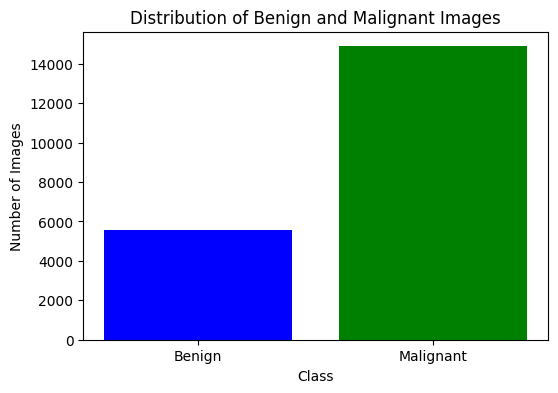

In [12]:
class_counts = count_images_by_class(train_dataset)


def plot_class_distribution(class_counts):
    classes = list(class_counts.keys())
    counts = list(class_counts.values())
    
    plt.figure(figsize=(6, 4))
    plt.bar(classes, counts, color=['blue', 'green'])
    plt.xlabel('Class')
    plt.ylabel('Number of Images')
    plt.title('Distribution of Benign and Malignant Images')
    plt.show()


plot_class_distribution(class_counts)

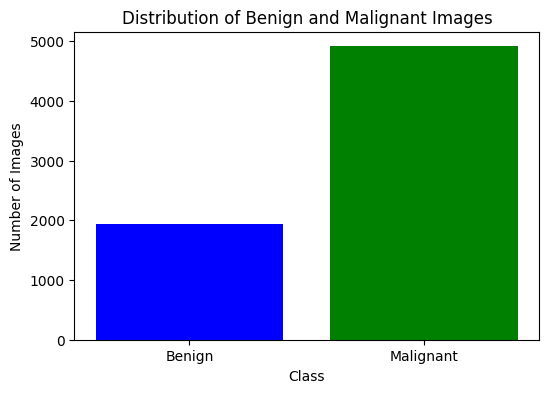

In [13]:
# Count the images in the dataset
class_counts = count_images_by_class(test_dataset)

# Plot the counts as a bar chart
def plot_class_distribution(class_counts):
    classes = list(class_counts.keys())
    counts = list(class_counts.values())
    
    plt.figure(figsize=(6, 4))
    plt.bar(classes, counts, color=['blue', 'green'])
    plt.xlabel('Class')
    plt.ylabel('Number of Images')
    plt.title('Distribution of Benign and Malignant Images')
    plt.show()

# Call the plot function
plot_class_distribution(class_counts)

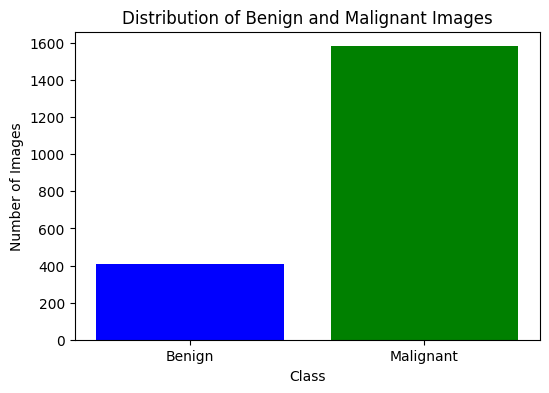

In [14]:

class_counts = count_images_by_class(val_dataset)

def plot_class_distribution(class_counts):
    classes = list(class_counts.keys())
    counts = list(class_counts.values())
    
    plt.figure(figsize=(6, 4))
    plt.bar(classes, counts, color=['blue', 'green'])
    plt.xlabel('Class')
    plt.ylabel('Number of Images')
    plt.title('Distribution of Benign and Malignant Images')
    plt.show()

plot_class_distribution(class_counts)

In [8]:
import os
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

class CustomImageDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.image_paths = []
        self.labels = []
        self.transform = transform
        valid_extensions = ('.jpg', '.jpeg', '.png', '.bmp')

        # Map class names to numerical values
        self.label_map = {'Benign': 0, 'Malignant': 1}

        def find_images(path, label):
            for entry in os.listdir(path):
                entry_path = os.path.join(path, entry)
                if os.path.isdir(entry_path):
                    find_images(entry_path, label)  # Recursive call for subdirectories
                elif os.path.isfile(entry_path) and entry_path.lower().endswith(valid_extensions):
                    self.image_paths.append(entry_path)
                    self.labels.append(self.label_map[label])  # Convert to numerical label

        # Loop over each class directory in the dataset
        for class_dir in os.listdir(root_dir):
            class_path = os.path.join(root_dir, class_dir)
            if os.path.isdir(class_path):
                find_images(class_path, class_dir)

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        image = Image.open(img_path).convert('RGB')

        if self.transform:
            image = self.transform(image)

        label = self.labels[idx]  # Now this will be an integer label
        return image, label

# Define transformations
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize image to 224x224
    transforms.ToTensor(),          # Convert image to tensor
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize using ImageNet mean and std
])

# Paths to your dataset directories (updated based on your given paths)
train_dir = '/kaggle/input/trace-tumor-notebook/train'
val_dir = '/kaggle/input/trace-tumor-notebook/val'
test_dir = '/kaggle/input/trace-tumor-notebook/test'

# Initialize datasets with the transformations
train_dataset = CustomImageDataset(root_dir=train_dir, transform=transform)
val_dataset = CustomImageDataset(root_dir=val_dir, transform=transform)
test_dataset = CustomImageDataset(root_dir=test_dir, transform=transform)

# Create DataLoader
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

for batch_idx, (images, labels) in enumerate(train_loader):
    print(f"Batch {batch_idx + 1}")
    print(f"Image batch shape: {images.size()}")
    print(f"Label batch: {labels}")
    break  # To prevent looping through all batches in this example

Batch 1
Image batch shape: torch.Size([32, 3, 224, 224])
Label batch: tensor([0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1,
        0, 1, 1, 1, 1, 1, 1, 1])


In [16]:
# Get the number of batches in your DataLoader
num_batches = len(train_loader)

print(f"Total number of batches: {num_batches}")

Total number of batches: 639


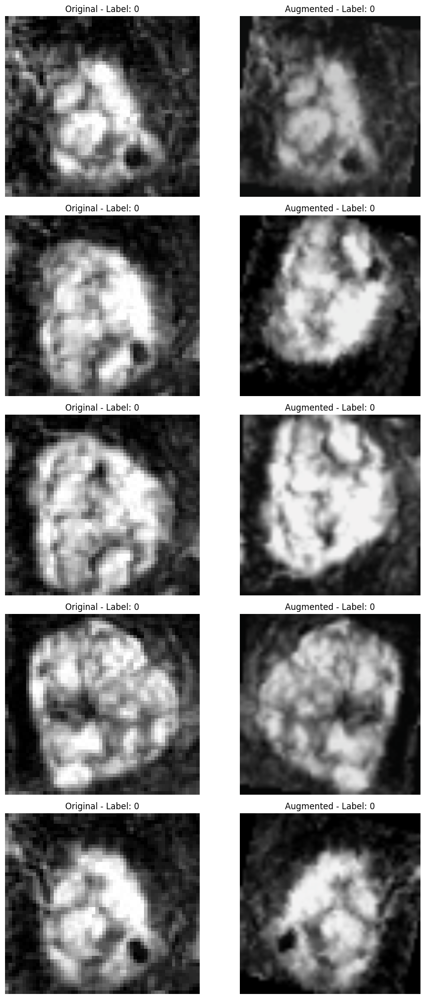

In [17]:
# Define the augmentations and normalization for the training dataset
augmentation_and_normalization_transforms = transforms.Compose([
    transforms.RandomHorizontalFlip(p=0.5),       # Randomly flip the image horizontally with 50% probability
    transforms.RandomVerticalFlip(p=0.5),         # Randomly flip the image vertically with 50% probability
    transforms.RandomRotation(degrees=20),        # Randomly rotate the image by up to 20 degrees
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),  # Random color jitter
    transforms.Resize((224, 224)),                # Resize the image to 224x224
    transforms.ToTensor(),                        # Convert image to tensor
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])    # Normalize using ImageNet mean and std
])

# Create dataset and apply augmentations to all images
train_dataset_aug = CustomImageDataset(
    root_dir='/kaggle/input/trace-tumor-notebook/train',  # Change this to your path
    transform=augmentation_and_normalization_transforms
)

# Function to display images before and after augmentation
def show_augmentations(dataset, num_images=5):
    fig, axs = plt.subplots(num_images, 2, figsize=(10, num_images * 4))

    for i in range(num_images):
        # Load original image (before augmentations)
        img_path = dataset.image_paths[i]
        original_img = Image.open(img_path).convert('RGB')

        # Load augmented image
        augmented_img, label = dataset[i]

        # Plot original image
        axs[i, 0].imshow(original_img)
        axs[i, 0].set_title(f"Original - Label: {dataset.labels[i]}")
        axs[i, 0].axis('off')

        # Plot augmented image (convert back to NumPy for visualization)
        augmented_img_np = augmented_img.permute(1, 2, 0).numpy()  # Convert to (H, W, C)
        augmented_img_np = augmented_img_np * [0.229, 0.224, 0.225] + [0.485, 0.456, 0.406]  # Denormalize
        augmented_img_np = augmented_img_np.clip(0, 1)  # Ensure values are between 0 and 1

        axs[i, 1].imshow(augmented_img_np)
        axs[i, 1].set_title(f"Augmented - Label: {dataset.labels[i]}")
        axs[i, 1].axis('off')

    plt.tight_layout()
    plt.show()

# Show a few images before and after augmentation
show_augmentations(train_dataset_aug, num_images=5)

In [18]:
hi = len(train_dataset_aug)
print(hi)

20434


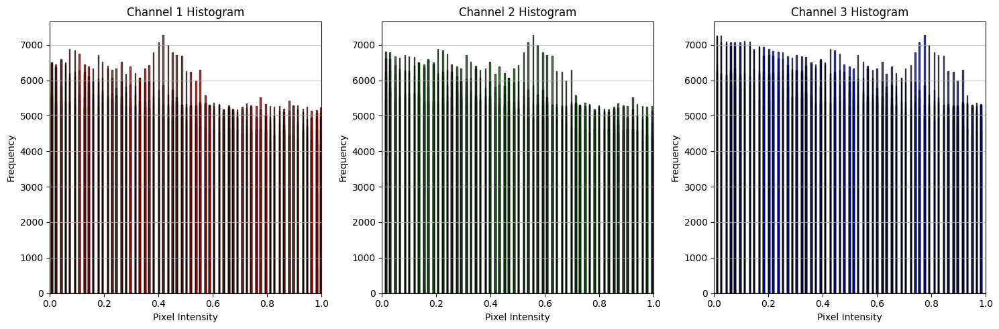

In [19]:
import matplotlib.pyplot as plt
import numpy as np
import torch

# Function to plot colorful histogram of pixel values
def plot_colorful_pixel_histogram(data_loader, num_images=5):
    # Set up the colors for each channel (R, G, B)
    colors = ['red', 'green', 'blue']
    plt.figure(figsize=(15, 5))

    # Loop through a few batches of the data loader
    for i, (images, _) in enumerate(data_loader):
        if i >= num_images:  # Limit to a certain number of images
            break
        
        # Convert images to numpy and reshape
        images_np = images.permute(0, 2, 3, 1).cpu().numpy()  # Change to (batch, height, width, channels)
        images_np = images_np.reshape(-1, images_np.shape[-1])  # Flatten to (num_pixels, channels)

        # Calculate and plot the histogram for each channel (R, G, B)
        for channel in range(images_np.shape[1]):
            plt.subplot(1, 3, channel + 1)
            plt.hist(images_np[:, channel], bins=256, range=(0, 1), color=colors[channel], alpha=0.7, edgecolor='black')
            plt.title(f'Channel {channel + 1} Histogram')
            plt.xlim(0, 1)  # Assuming pixel values are normalized between 0 and 1
            plt.xlabel('Pixel Intensity')
            plt.ylabel('Frequency')
            plt.grid(axis='y', alpha=0.75)  # Add gridlines for better readability
            
    plt.tight_layout()
    plt.show()

# Call the function to plot colorful histograms
plot_colorful_pixel_histogram(train_loader)

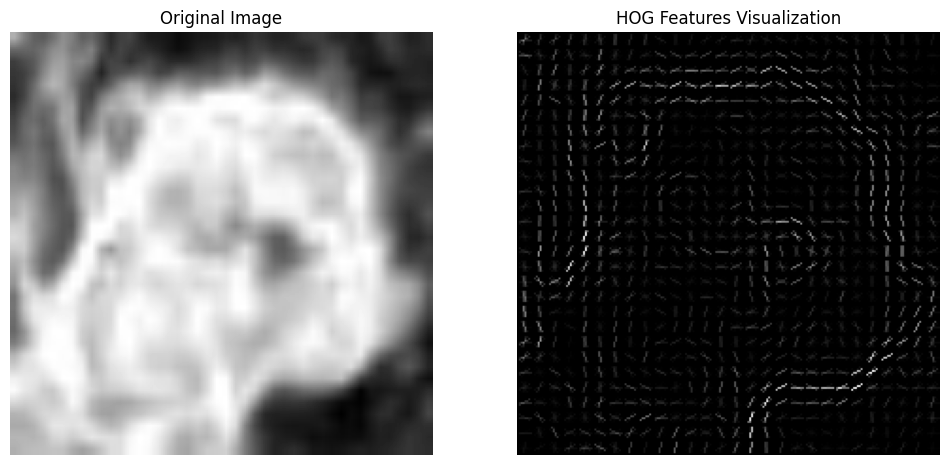

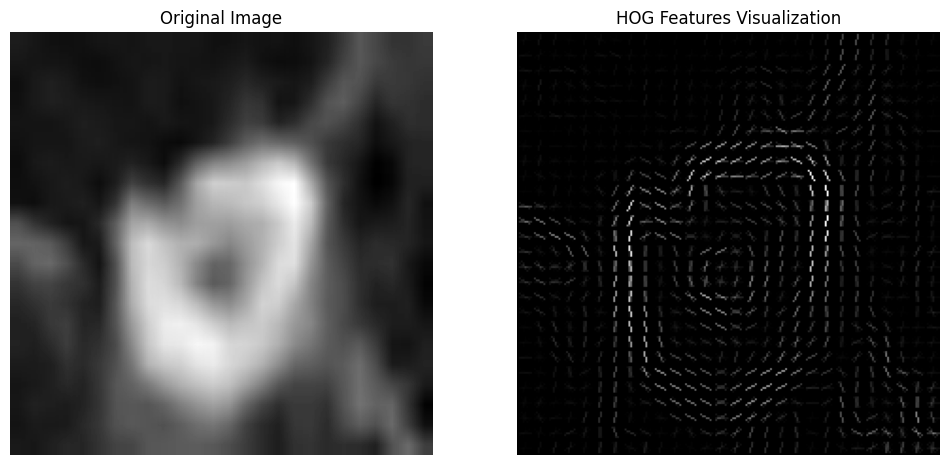

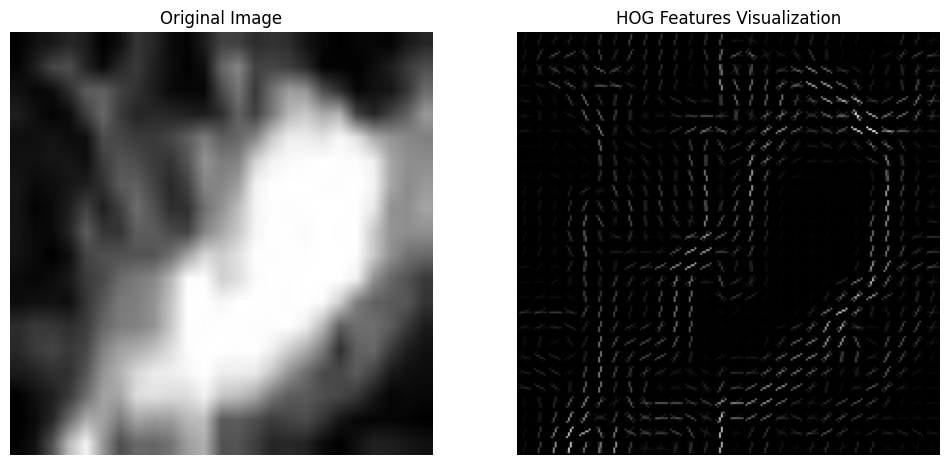

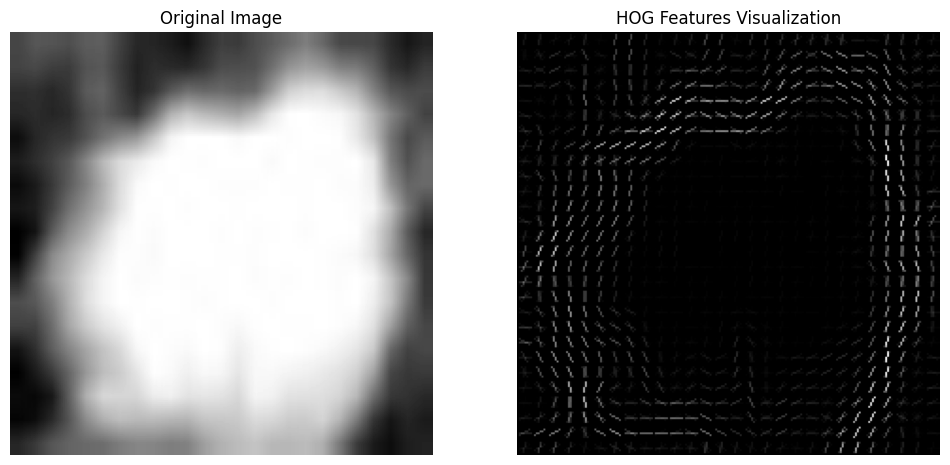

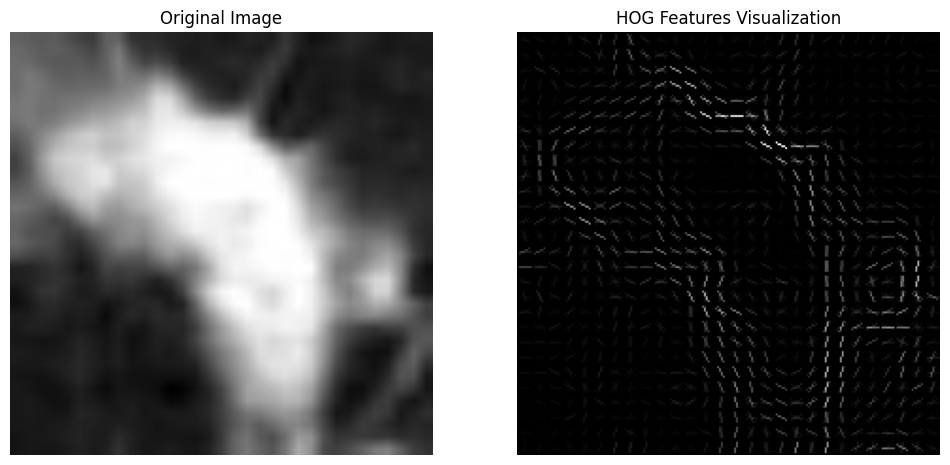

In [20]:
import torch 
from skimage.feature import hog
from skimage import exposure
import numpy as np
import matplotlib.pyplot as plt

# Assuming 'train_loader' is your DataLoader with images loaded
def extract_hog_features(data_loader):
    hog_features = []
    hog_labels = []
    count = 0  # Initialize a counter to keep track of the number of images displayed

    # Iterate through the DataLoader
    for images, labels in data_loader:
        # Convert tensor to numpy array and compute HOG features
        for img, label in zip(images, labels):
            if count >= 5:  # Stop after displaying 5 images
                break
            
            # Convert tensor to numpy array
            img_np = img.permute(1, 2, 0).numpy()  # Change from (C, H, W) to (H, W, C)
            img_np = (img_np * [0.229, 0.224, 0.225] + [0.485, 0.456, 0.406])  # Denormalize
            img_np = img_np.clip(0, 1)  # Ensure values are between 0 and 1

            # Convert to grayscale for HOG
            img_gray = 0.2989 * img_np[:, :, 0] + 0.5870 * img_np[:, :, 1] + 0.1140 * img_np[:, :, 2]  # Correct grayscale conversion

            # Compute HOG features
            features, hog_image = hog(img_gray, 
                                       orientations=9, 
                                       pixels_per_cell=(8, 8), 
                                       cells_per_block=(2, 2), 
                                       visualize=True)

            # Rescale the HOG image for better visualization
            hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))

            # Store features and labels
            hog_features.append(features)
            hog_labels.append(label.item())  # Convert tensor to Python integer
            
            # Display original grayscale image and HOG image side by side
            plt.figure(figsize=(12, 6))
            plt.subplot(1, 2, 1)
            plt.imshow(img_gray, cmap='gray')  # Display the grayscale image
            plt.title("Original Image")
            plt.axis('off')
            
            plt.subplot(1, 2, 2)
            plt.imshow(hog_image_rescaled, cmap='gray')
            plt.title("HOG Features Visualization")
            plt.axis('off')
            
            plt.show()  # Show the images
            
            count += 1  # Increment the counter

        if count >= 5:  # Break outer loop if 5 images have been processed
            break

    return hog_features, hog_labels

# Extract HOG features and display images
hog_features, hog_labels = extract_hog_features(train_loader)

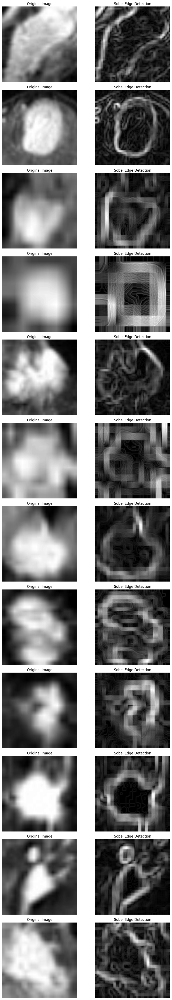

In [21]:
import cv2
import torch
import numpy as np
import matplotlib.pyplot as plt

def apply_sobel_edge_detection_on_batch(data_loader, batch_size=5):
    images, _ = next(iter(data_loader))  

    fig, axs = plt.subplots(batch_size, 2, figsize=(10, batch_size * 4)) 

    for i in range(batch_size):
        # Convert the tensor image to NumPy array for OpenCV processing
        img_tensor = images[i]
        img_np = img_tensor.permute(1, 2, 0).numpy()  # Convert (C, H, W) to (H, W, C)
        img_np = img_np * [0.229, 0.224, 0.225] + [0.485, 0.456, 0.406]  # Denormalize
        img_np = (img_np * 255).astype(np.uint8)  # Convert to uint8 for OpenCV

        # Check if the image is already grayscale
        if img_np.shape[2] == 1:  # If it has only one channel
            gray_image = img_np
        else:
            # Convert the image to grayscale if it's not already
            gray_image = cv2.cvtColor(img_np, cv2.COLOR_RGB2GRAY)

        # Apply Sobel Edge Detection
        sobel_x = cv2.Sobel(gray_image, cv2.CV_64F, 1, 0, ksize=5)  # Sobel in X direction
        sobel_y = cv2.Sobel(gray_image, cv2.CV_64F, 0, 1, ksize=5)  # Sobel in Y direction
        edges_sobel = np.sqrt(sobel_x**2 + sobel_y**2)  # Magnitude of Sobel edges

        # Plot the original and Sobel edge detection result
        axs[i, 0].imshow(gray_image, cmap='gray')  # Original grayscale image
        axs[i, 0].set_title("Original Image")
        axs[i, 0].axis('off')

        axs[i, 1].imshow(edges_sobel, cmap='gray')  # Sobel edge detection image
        axs[i, 1].set_title("Sobel Edge Detection")
        axs[i, 1].axis('off')

    plt.tight_layout()
    plt.show()

# Now call the function and pass your DataLoader object
apply_sobel_edge_detection_on_batch(train_loader, batch_size=12)

In [22]:
import numpy as np

A = np.array([[1, 2, 3],
              [4, 5, 6],
              [7, 8, 9]])

Filt = np.array([[1, 0],
                 [0, -1]])

def conv(A, Filt):
    A_x, A_y = A.shape
    Filt_x, Filt_y = Filt.shape
    
    # Calculate the padding or radius for height and width
    hrad, wrad = Filt_x // 2, Filt_y // 2
    print(f"Filter half sizes - hrad: {hrad}, wrad: {wrad}")
    
    # Initialize the output matrix with zeros
    output_matr = np.zeros((A_x - Filt_x + 1, A_y - Filt_y + 1))
    
    # Loop over every element in the input array where the filter can be applied
    for i in range(hrad, A_x - hrad):
        for j in range(wrad, A_y - wrad):
           
            region = A[i-hrad:i-hrad+Filt_x, j-wrad:j-wrad+Filt_y]
            
            output_matr[i-hrad, j-wrad] = np.sum(region * Filt)
    
    return output_matr

# Call the function
result = conv(A, Filt)
print(result)


Filter half sizes - hrad: 1, wrad: 1
[[-4.  0.]
 [ 0.  0.]]


Filter half sizes - hrad: 1, wrad: 1


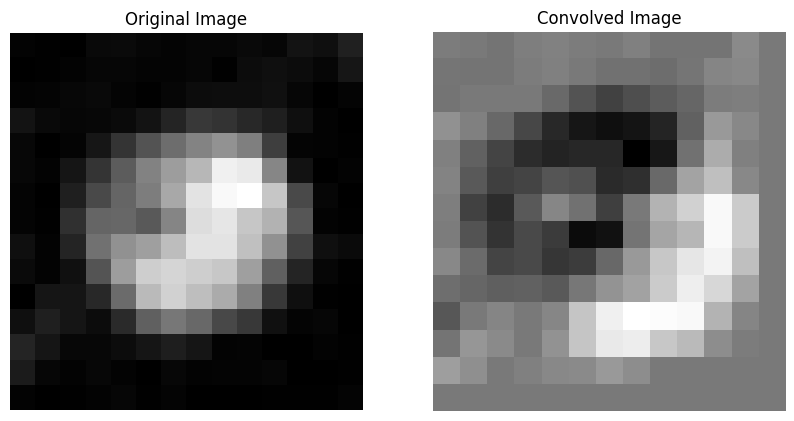

In [23]:

img_path = '/kaggle/input/trace-tumor-notebook/test/Benign/BreaDM-Be-1813/SUB2/p-017.jpg'  # Change to your path
img = Image.open(img_path).convert('L')  # Convert to grayscale

# Convert image to NumPy array
img_np = np.array(img)

Filt = np.array([[1, 0],
                 [0, -1]])

convolved_image = conv(img_np, Filt)

plt.figure(figsize=(10, 5))


plt.subplot(1, 2, 1)
plt.imshow(img_np, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# Convolved image
plt.subplot(1, 2, 2)
plt.imshow(convolved_image, cmap='gray')
plt.title('Convolved Image')
plt.axis('off')

plt.show()

In [24]:
import torch

# Assuming `data_loader` is your DataLoader object
def check_image_color_format(data_loader):
    images, labels = next(iter(data_loader))  # Get a batch of images and labels

    for i in range(len(images)):
        img_tensor = images[i]
        img_shape = img_tensor.shape

        print(f"Image {i+1}: Shape = {img_shape}")

        if len(img_shape) == 2:
            print("This image is Grayscale (H, W)")
        elif len(img_shape) == 3:
            if img_shape[0] == 1:
                print("This image is Grayscale (1, H, W)")
            elif img_shape[0] == 3:
                print("This image is RGB (3, H, W)")
            else:
                print("Unexpected channel format")
        else:
            print("Unknown format")

# Call the function
check_image_color_format(train_loader)

Image 1: Shape = torch.Size([3, 224, 224])
This image is RGB (3, H, W)
Image 2: Shape = torch.Size([3, 224, 224])
This image is RGB (3, H, W)
Image 3: Shape = torch.Size([3, 224, 224])
This image is RGB (3, H, W)
Image 4: Shape = torch.Size([3, 224, 224])
This image is RGB (3, H, W)
Image 5: Shape = torch.Size([3, 224, 224])
This image is RGB (3, H, W)
Image 6: Shape = torch.Size([3, 224, 224])
This image is RGB (3, H, W)
Image 7: Shape = torch.Size([3, 224, 224])
This image is RGB (3, H, W)
Image 8: Shape = torch.Size([3, 224, 224])
This image is RGB (3, H, W)
Image 9: Shape = torch.Size([3, 224, 224])
This image is RGB (3, H, W)
Image 10: Shape = torch.Size([3, 224, 224])
This image is RGB (3, H, W)
Image 11: Shape = torch.Size([3, 224, 224])
This image is RGB (3, H, W)
Image 12: Shape = torch.Size([3, 224, 224])
This image is RGB (3, H, W)
Image 13: Shape = torch.Size([3, 224, 224])
This image is RGB (3, H, W)
Image 14: Shape = torch.Size([3, 224, 224])
This image is RGB (3, H, W)
I

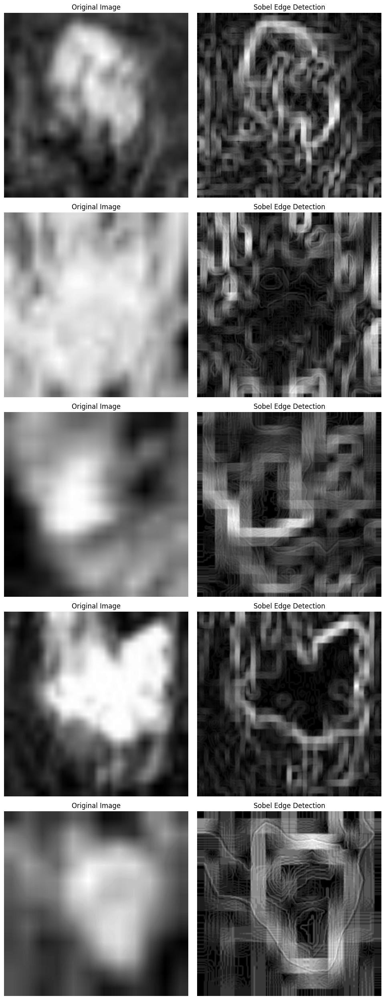

In [25]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Define Sobel operators for X and Y directions
sobel_x_operator = np.array([[1, 0, -1],
                              [2, 0, -2],
                              [1, 0, -1]])  # Sobel X operator

sobel_y_operator = np.array([[1, 2, 1],
                              [0, 0, 0],
                              [-1, -2, -1]])  # Sobel Y operator

def convolution(image, kernel):
    # Get dimensions of the image and the kernel
    image_x, image_y = image.shape
    kernel_x, kernel_y = kernel.shape

    # Calculate output dimensions
    output_x = image_x - kernel_x + 1
    output_y = image_y - kernel_y + 1

    # Initialize output array
    output = np.zeros((output_x, output_y))

    # Perform convolution
    for i in range(output_x):
        for j in range(output_y):
            sub_matrix = image[i:i + kernel_x, j:j + kernel_y]
            output[i, j] = np.sum(sub_matrix * kernel)

    return output

def apply_sobel_on_batch(data_loader, batch_size=5):
    images, _ = next(iter(data_loader))  # Get one batch of images

    fig, axs = plt.subplots(batch_size, 2, figsize=(10, batch_size * 5))

    for i in range(batch_size):
        # Convert the tensor image to NumPy array for OpenCV processing
        img_tensor = images[i]
        img_np = img_tensor.permute(1, 2, 0).numpy()  # Convert (C, H, W) to (H, W, C)
        img_np = img_np * [0.229, 0.224, 0.225] + [0.485, 0.456, 0.406]  # Denormalize
        img_np = (img_np * 255).astype(np.uint8)  # Convert to uint8 for OpenCV
        
        # Convert the image to grayscale
        gray_image = cv2.cvtColor(img_np, cv2.COLOR_RGB2GRAY)

        # Apply Sobel operators
        gradient_x = convolution(gray_image, sobel_x_operator)
        gradient_y = convolution(gray_image, sobel_y_operator)

        # Calculate the magnitude of the gradient
        magnitude = np.sqrt(gradient_x ** 2 + gradient_y ** 2)
        magnitude = np.clip(magnitude, 0, 255).astype(np.uint8)

        # Plot the original grayscale image and the Sobel image
        axs[i, 0].imshow(gray_image, cmap='gray')
        axs[i, 0].set_title("Original Image")
        axs[i, 0].axis('off')

        axs[i, 1].imshow(magnitude, cmap='gray')
        axs[i, 1].set_title("Sobel Edge Detection")
        axs[i, 1].axis('off')

    plt.tight_layout()
    plt.show()

# Call the function to apply Sobel edge detection on a batch from your train loader
apply_sobel_on_batch(train_loader, batch_size=5)

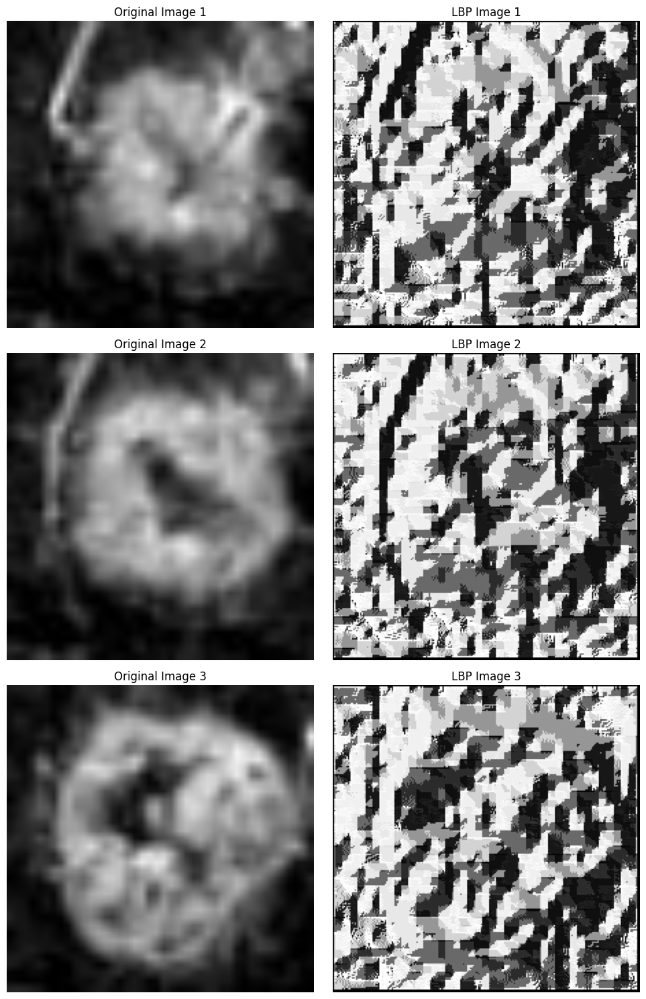

In [26]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Custom LBP function
def getLBPimage(gray_image):
    imgLBP = np.zeros_like(gray_image)
    neighboor = 3
    for ih in range(0, gray_image.shape[0] - neighboor):
        for iw in range(0, gray_image.shape[1] - neighboor):
            
            
            # Step 1: 3x3 neighborhood
            img = gray_image[ih:ih + neighboor, iw:iw + neighboor]
            center = img[1, 1]
            img01 = (img >= center) * 1.0
            img01_vector = img01.T.flatten()

            # Step 2: Binary operation
            img01_vector = np.delete(img01_vector, 4)

            # Step 3: Convert to decimal
            where_img01_vector = np.where(img01_vector)[0]
            if len(where_img01_vector) >= 1:
                num = np.sum(2 ** where_img01_vector)
            else:
                num = 0
            imgLBP[ih + 1, iw + 1] = num

    return imgLBP

# Function to load images
def process_images(image_paths):
    fig, axs = plt.subplots(3, 2, figsize=(10, 15))

    for i, img_path in enumerate(image_paths):
        
        image = cv2.imread(img_path)
        image_resized = cv2.resize(image, (224, 224))
        gray_image = cv2.cvtColor(image_resized, cv2.COLOR_BGR2GRAY)

        # Apply LBP
        lbp_image = getLBPimage(gray_image)

        # Display original and LBP image
        axs[i, 0].imshow(cv2.cvtColor(image_resized, cv2.COLOR_BGR2RGB))
        axs[i, 0].set_title(f"Original Image {i+1}")
        axs[i, 0].axis('off')

        axs[i, 1].imshow(lbp_image, cmap='gray')
        axs[i, 1].set_title(f"LBP Image {i+1}")
        axs[i, 1].axis('off')

    plt.tight_layout()
    plt.show()

image_paths = [
    '/kaggle/input/trace-tumor-notebook/train/Malignant/BreaDM-Ma-1802/SUB1/p-035.jpg',
    '/kaggle/input/trace-tumor-notebook/train/Malignant/BreaDM-Ma-1802/SUB1/p-036.jpg',
    '/kaggle/input/trace-tumor-notebook/train/Malignant/BreaDM-Ma-1802/SUB1/p-040.jpg']

process_images(image_paths)

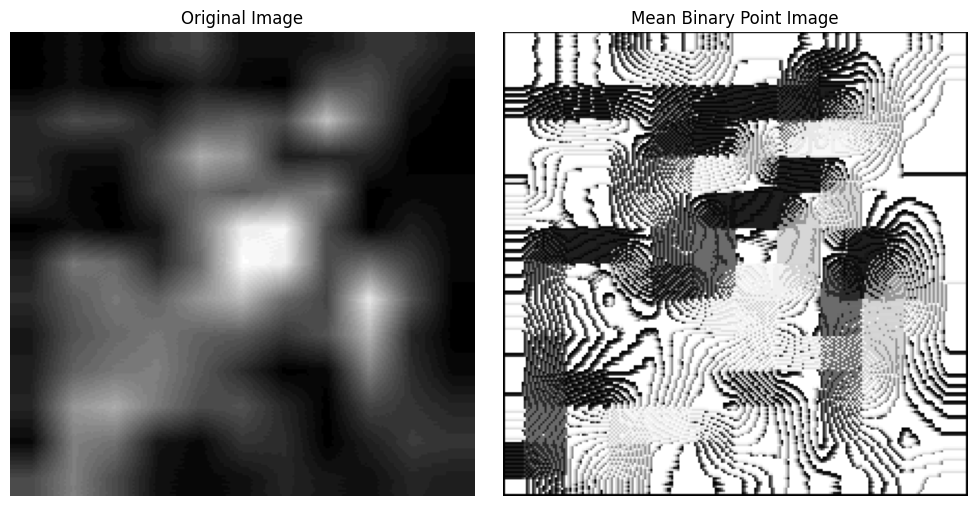

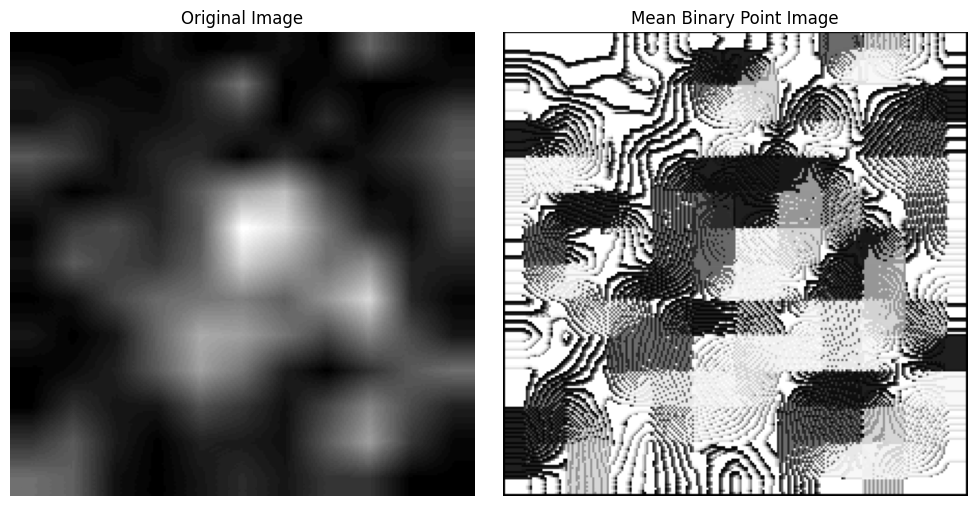

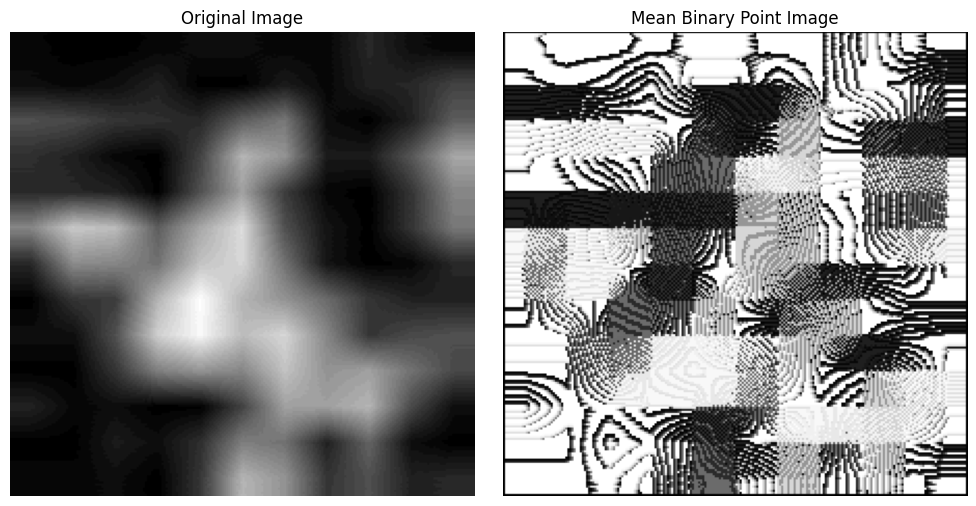

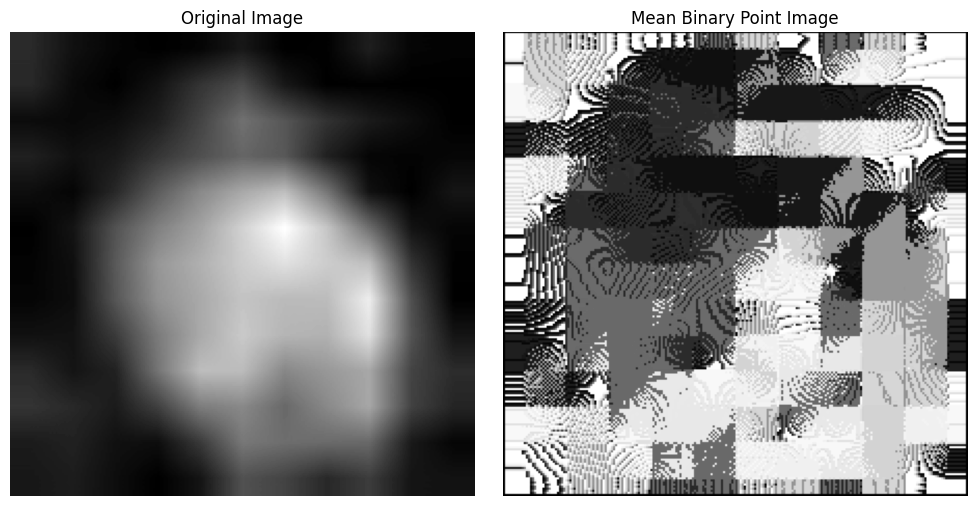

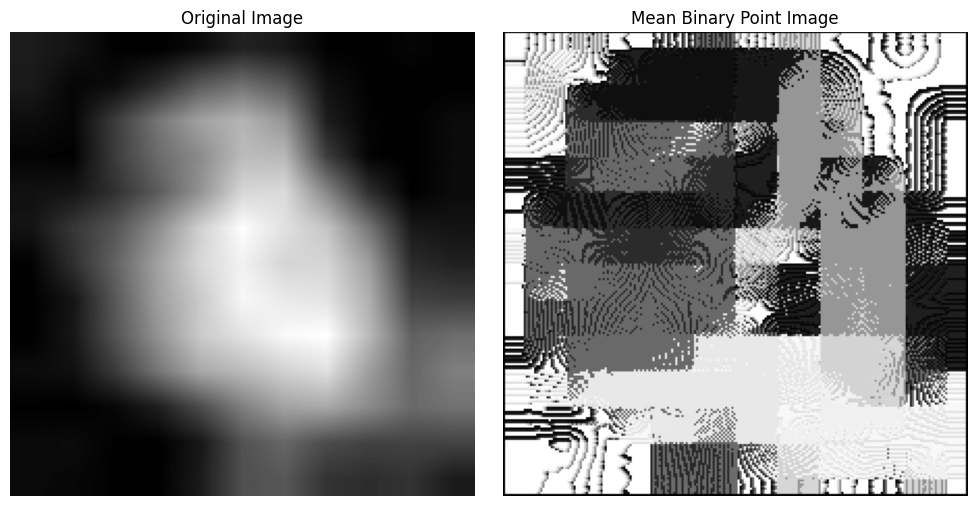

In [27]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def calculate_mean_binary_point(image, window_size=3):
    rows, cols = image.shape
    mbp_image = np.zeros((rows, cols), dtype=np.uint8)

    # Iterate through the image, skipping the border pixels
    for i in range(1, rows - 1):
        for j in range(1, cols - 1):
            window = image[i - 1:i + 2, j - 1:j + 2]
            mean = np.mean(window)

            # Creating binary pattern based on the mean threshold
            binary_str = ''
            for x in range(3):
                for y in range(3):
                    if (x, y) != (1, 1):  # Exclude center pixel
                        binary_str += '1' if window[x, y] >= mean else '0'

            mbp_value = int(binary_str, 2)  # Convert binary string to integer
            mbp_image[i, j] = mbp_value

    # Normalize the MBP image for better visibility
    mbp_image = cv2.normalize(mbp_image, None, 0, 255, cv2.NORM_MINMAX)

    return mbp_image

def display_results(original_image, mbp_image):
    plt.figure(figsize=(10, 5))

    # Original Image
    plt.subplot(1, 2, 1)
    plt.imshow(original_image, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    # MBP Image
    plt.subplot(1, 2, 2)
    plt.imshow(mbp_image, cmap='gray')
    plt.title('Mean Binary Point Image')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# List of image paths
image_paths = [
    '/kaggle/input/trace-tumor-notebook/train/Benign/BreaDM-Be-1811/SUB1/p-028.jpg',
    '/kaggle/input/trace-tumor-notebook/train/Benign/BreaDM-Be-1811/SUB1/p-029.jpg',
    '/kaggle/input/trace-tumor-notebook/train/Benign/BreaDM-Be-1811/SUB1/p-030.jpg',
    '/kaggle/input/trace-tumor-notebook/train/Benign/BreaDM-Be-1811/SUB2/p-029.jpg',
    '/kaggle/input/trace-tumor-notebook/train/Benign/BreaDM-Be-1811/SUB2/p-030.jpg'
]

# Process and display results for each image
for image_path in image_paths:
    # Load the grayscale image
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    # Resize the image to 224x224
    image_resized = cv2.resize(image, (224, 224))
    
    # Calculate Mean Binary Point
    mbp_image = calculate_mean_binary_point(image_resized)
    
    # Display results
    display_results(image_resized, mbp_image)

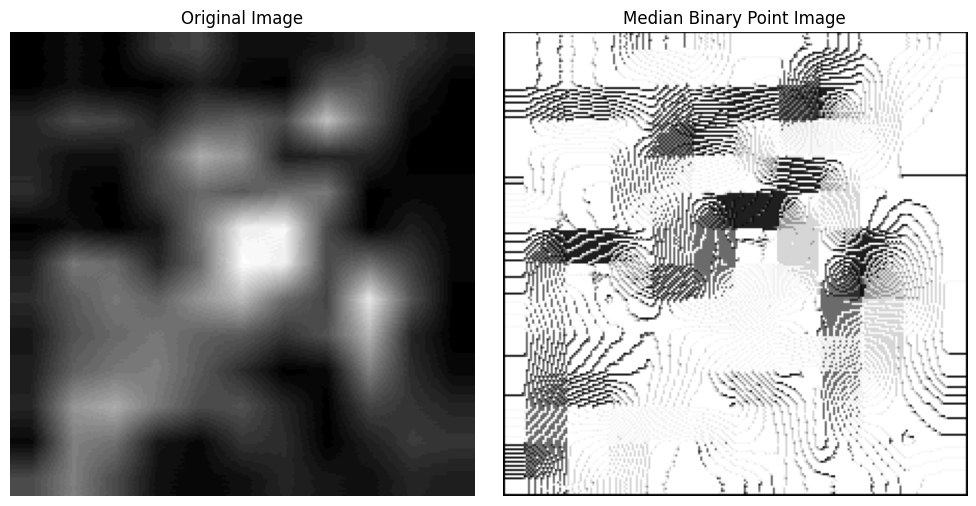

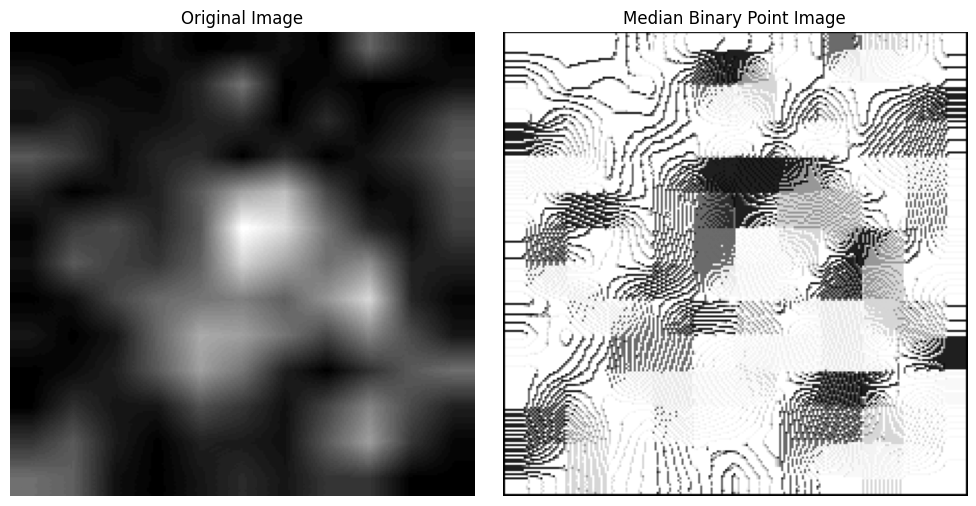

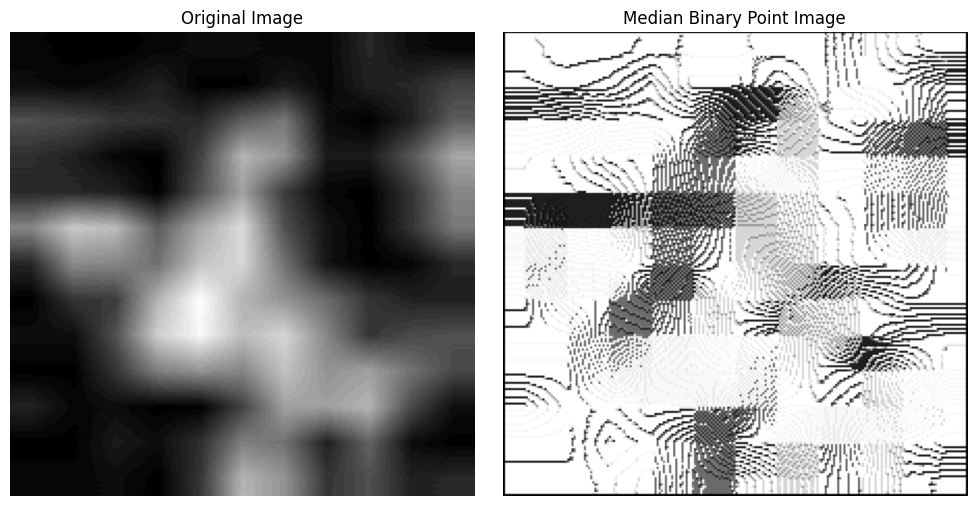

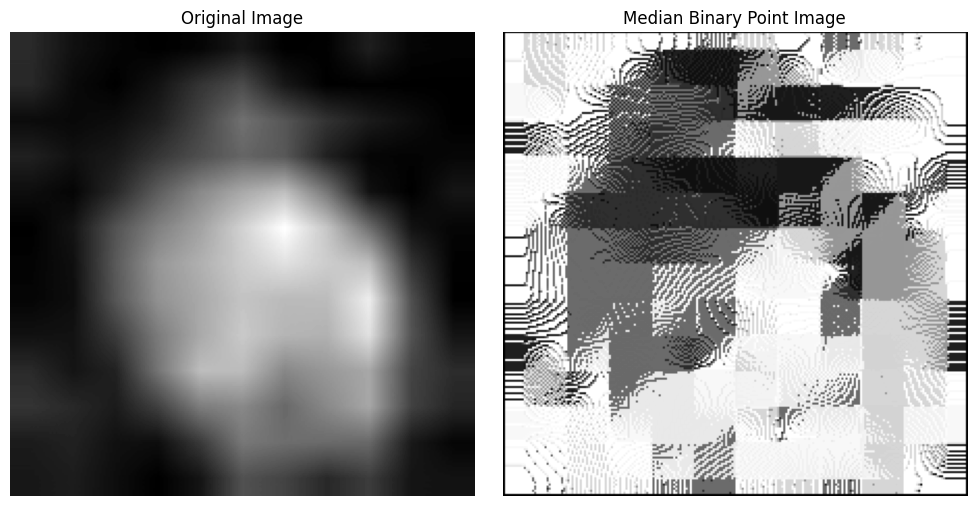

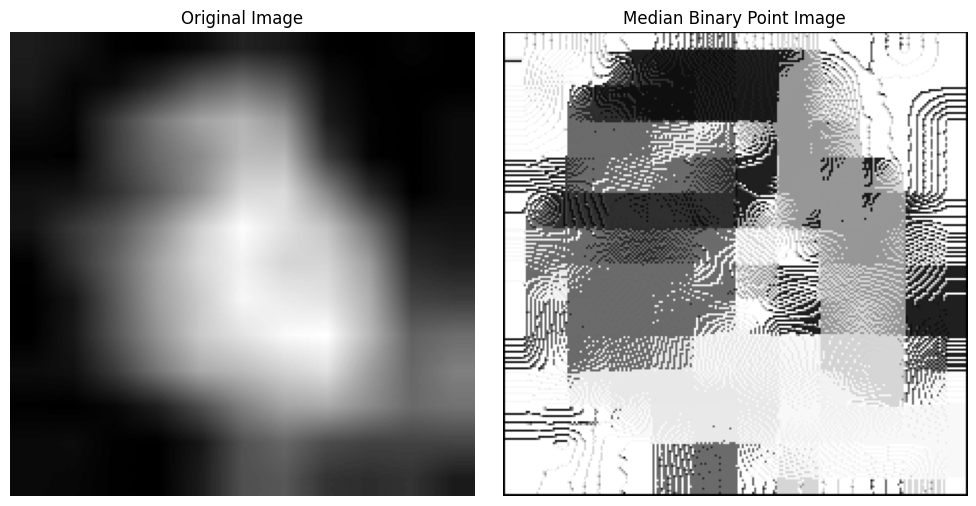

In [28]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def calculate_median_binary_point(image, window_size=3):
    rows, cols = image.shape
    mbp_image = np.zeros((rows, cols), dtype=np.uint8)

    # Iterate through the image, skipping the border pixels
    for i in range(1, rows - 1):
        for j in range(1, cols - 1):
            window = image[i - 1:i + 2, j - 1:j + 2]
            median = np.median(window)

            # Creating binary pattern based on the median threshold
            binary_str = ''
            for x in range(3):
                for y in range(3):
                    if (x, y) != (1, 1):  # Exclude center pixel
                        binary_str += '1' if window[x, y] >= median else '0'

            mbp_value = int(binary_str, 2)  # Convert binary string to integer
            mbp_image[i, j] = mbp_value

    # Normalize the MBP image for better visibility
    mbp_image = cv2.normalize(mbp_image, None, 0, 255, cv2.NORM_MINMAX)

    return mbp_image

def display_results(original_image, mbp_image):
    plt.figure(figsize=(10, 5))

    # Original Image
    plt.subplot(1, 2, 1)
    plt.imshow(original_image, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    # MBP Image
    plt.subplot(1, 2, 2)
    plt.imshow(mbp_image, cmap='gray')
    plt.title('Median Binary Point Image')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# List of image paths
image_paths = [
    '/kaggle/input/trace-tumor-notebook/train/Benign/BreaDM-Be-1811/SUB1/p-028.jpg',
    '/kaggle/input/trace-tumor-notebook/train/Benign/BreaDM-Be-1811/SUB1/p-029.jpg',
    '/kaggle/input/trace-tumor-notebook/train/Benign/BreaDM-Be-1811/SUB1/p-030.jpg',
    '/kaggle/input/trace-tumor-notebook/train/Benign/BreaDM-Be-1811/SUB2/p-029.jpg',
    '/kaggle/input/trace-tumor-notebook/train/Benign/BreaDM-Be-1811/SUB2/p-030.jpg'
]

# Process and display results for each image
for image_path in image_paths:
    # Load the grayscale image
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    # Resize the image to 224x224
    image_resized = cv2.resize(image, (224, 224))
    
    # Calculate Median Binary Point
    mbp_image = calculate_median_binary_point(image_resized)
    
    # Display results
    display_results(image_resized, mbp_image)

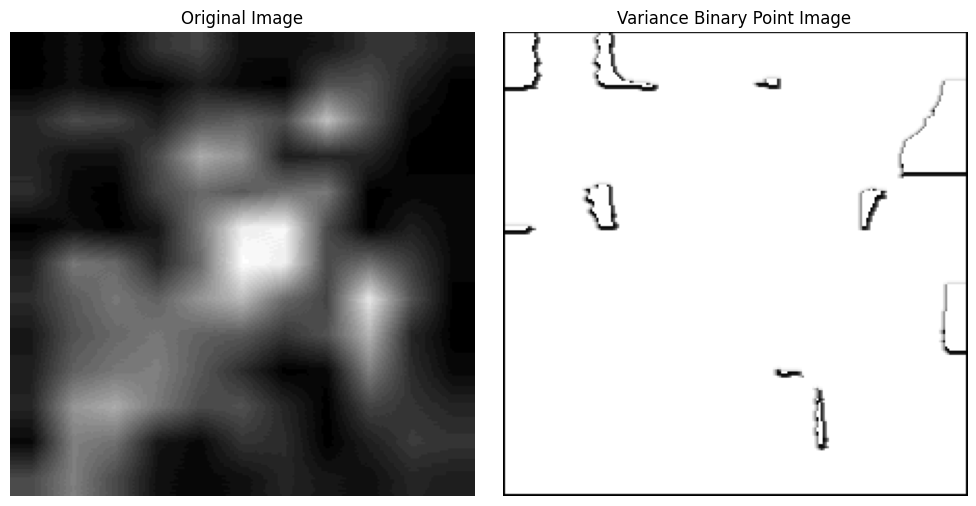

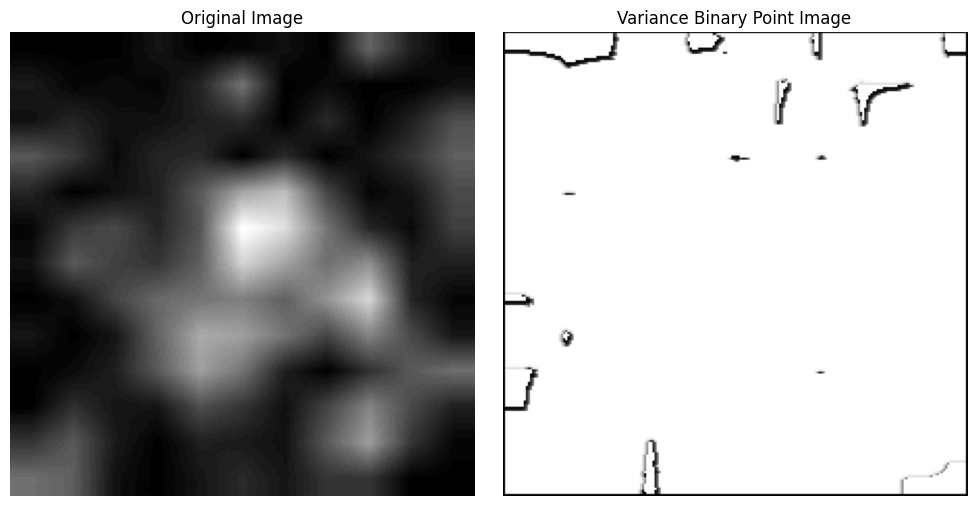

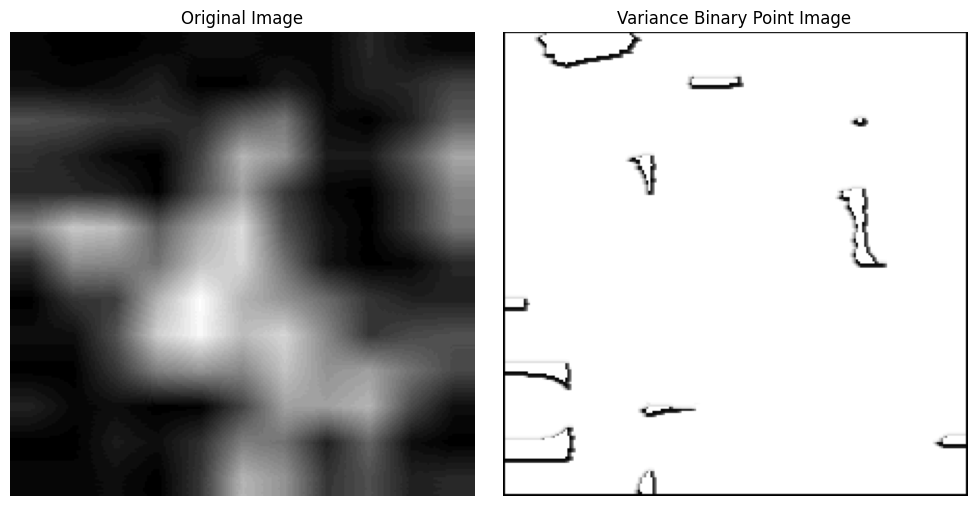

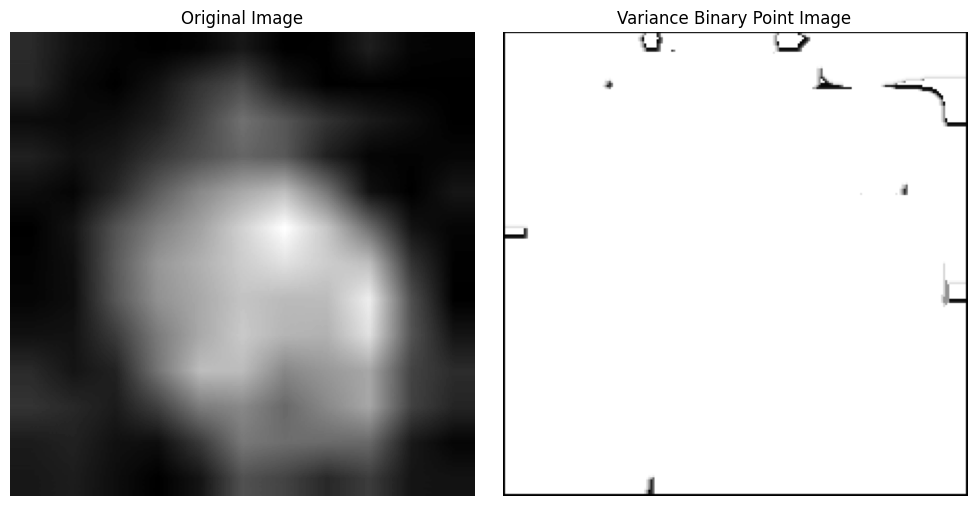

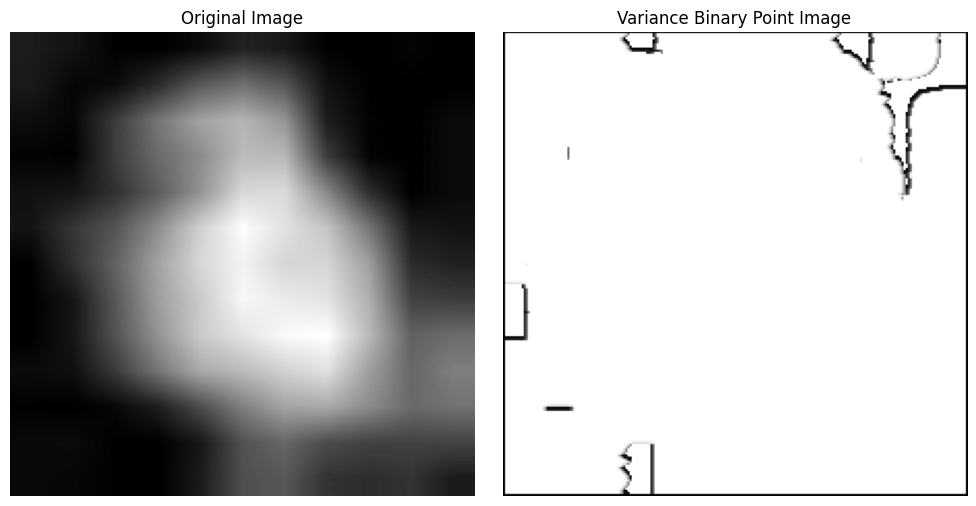

In [29]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def calculate_variance_binary_point(image, window_size=3):
    rows, cols = image.shape
    vbp_image = np.zeros((rows, cols), dtype=np.uint8)

    
    for i in range(1, rows - 1):
        for j in range(1, cols - 1):
            window = image[i - 1:i + 2, j - 1:j + 2]
            variance = np.var(window)

            
            binary_str = ''
            for x in range(3):
                for y in range(3):
                    if (x, y) != (1, 1):  # Exclude center pixel
                        binary_str += '1' if window[x, y] >= variance else '0'

            vbp_value = int(binary_str, 2)
            vbp_image[i, j] = vbp_value

    vbp_image = cv2.normalize(vbp_image, None, 0, 255, cv2.NORM_MINMAX)

    return vbp_image

def display_results(original_image, mbp_image):
    plt.figure(figsize=(10, 5))

    # Original Image
    plt.subplot(1, 2, 1)
    plt.imshow(original_image, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    # VBP Image
    plt.subplot(1, 2, 2)
    plt.imshow(vbp_image, cmap='gray')
    plt.title('Variance Binary Point Image')
    plt.axis('off')

    plt.tight_layout()
    plt.show()


image_paths = [
    '/kaggle/input/trace-tumor-notebook/train/Benign/BreaDM-Be-1811/SUB1/p-028.jpg',
    '/kaggle/input/trace-tumor-notebook/train/Benign/BreaDM-Be-1811/SUB1/p-029.jpg',
    '/kaggle/input/trace-tumor-notebook/train/Benign/BreaDM-Be-1811/SUB1/p-030.jpg',
    '/kaggle/input/trace-tumor-notebook/train/Benign/BreaDM-Be-1811/SUB2/p-029.jpg',
    '/kaggle/input/trace-tumor-notebook/train/Benign/BreaDM-Be-1811/SUB2/p-030.jpg'
]


for image_path in image_paths:
    # Load the grayscale image
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    # Resize the image to 224x224
    image_resized = cv2.resize(image, (224, 224))
    
    vbp_image = calculate_variance_binary_point(image_resized)
    
   
    display_results(image_resized, vbp_image)

In [30]:
import cv2
import numpy as np

def calculate_variance_binary_point(image, window_size=3):
    rows, cols = image.shape
    vbp_image = np.zeros((rows, cols), dtype=np.uint8)
    variance_values = []

    for i in range(1, rows - 1):
        for j in range(1, cols - 1):
            window = image[i - 1:i + 2, j - 1:j + 2]
            variance = np.var(window)
            variance_values.append(variance)  # Store the variance value
            
            binary_str = ''
            for x in range(3):
                for y in range(3):
                    if (x, y) != (1, 1):  # Exclude center pixel
                        binary_str += '1' if window[x, y] >= variance else '0'

            vbp_value = int(binary_str, 2)
            vbp_image[i, j] = vbp_value

    # Normalize the VBP image for better visibility
    vbp_image = cv2.normalize(vbp_image, None, 0, 255, cv2.NORM_MINMAX)

    return vbp_image, variance_values

# List of image paths
image_paths = [
    '/kaggle/input/trace-tumor-notebook/train/Benign/BreaDM-Be-1811/SUB1/p-028.jpg',
    '/kaggle/input/trace-tumor-notebook/train/Benign/BreaDM-Be-1811/SUB1/p-029.jpg',
    '/kaggle/input/trace-tumor-notebook/train/Benign/BreaDM-Be-1811/SUB1/p-030.jpg',
    '/kaggle/input/trace-tumor-notebook/train/Benign/BreaDM-Be-1811/SUB2/p-029.jpg',
    '/kaggle/input/trace-tumor-notebook/train/Benign/BreaDM-Be-1811/SUB2/p-030.jpg'
]


for image_path in image_paths:
    # Load the grayscale image
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    # Resize the image to 224x224
    image_resized = cv2.resize(image, (224, 224))
    
    # Calculate Variance Binary Point
    vbp_image, variances = calculate_variance_binary_point(image_resized)
    
    # Print variance values
    print(f"Variance values for image {image_path}:")
    print(variances)
    print('-' * 50)  # Separator line

Variance values for image /kaggle/input/trace-tumor-notebook/train/Benign/BreaDM-Be-1811/SUB1/p-028.jpg:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.1728395061728395, 0.2469135802469136, 0.09876543209876544, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.1728395061728395, 0.2469135802469136, 0.1728395061728395, 0.09876543209876544, 0.0, 0.0, 0.0, 0.09876543209876544, 0.1728395061728395, 0.2469135802469136, 0.1728395061728395, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.09876543209876544, 0.2222222222222222, 0.2222222222222222, 0.09876543209876543, 0.0, 0.0, 0.0, 0.0, 0.09876543209876543, 0.2469135802469136, 0.1728395061728395, 0.09876543209876544, 0.2469135802469136, 0.1728395061728395, 0.09876543209876544, 0.24691358024691354, 0.1728395061728395, 0.1728395061728395, 0.24691358024691354, 0.09876543209876544, 0.09876543209876544, 0.24691358024691354, 0.1728395061728395, 0.2222222222222222, 0.2222222222222222, 0.0, 0.2222222222222222, 0.2222222222222222, 0.0, 0.0, 0.0, 0.0, 0

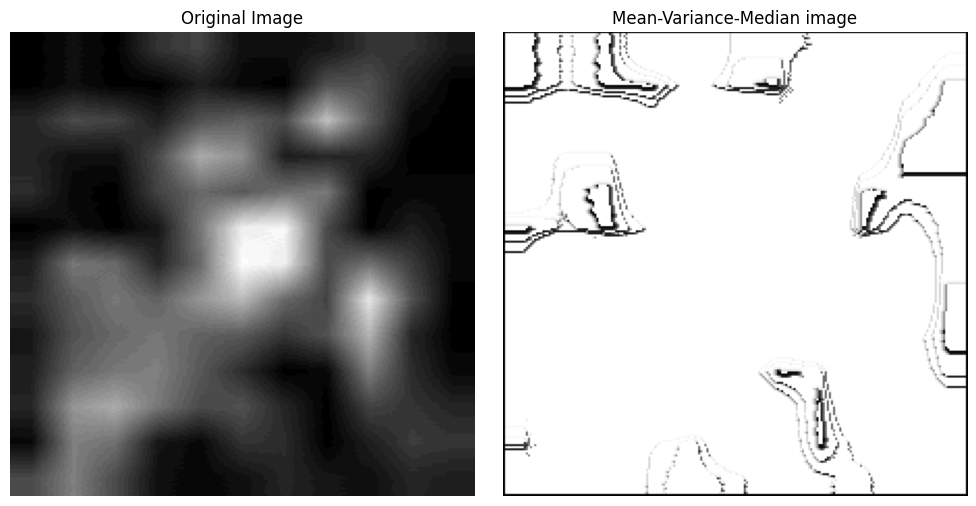

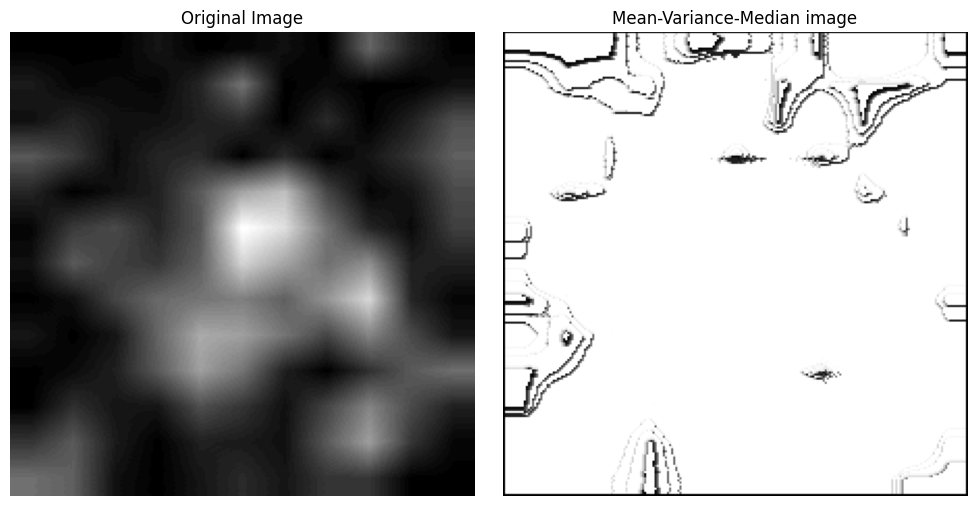

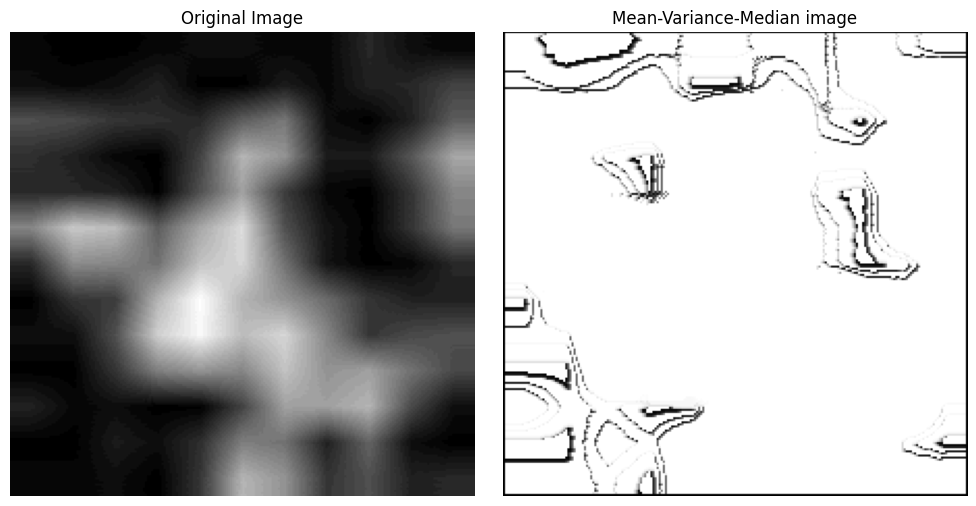

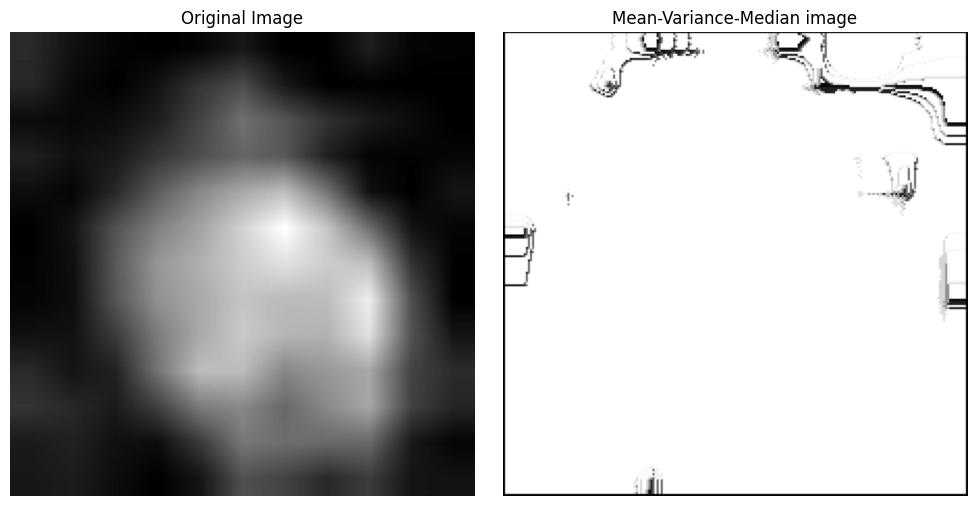

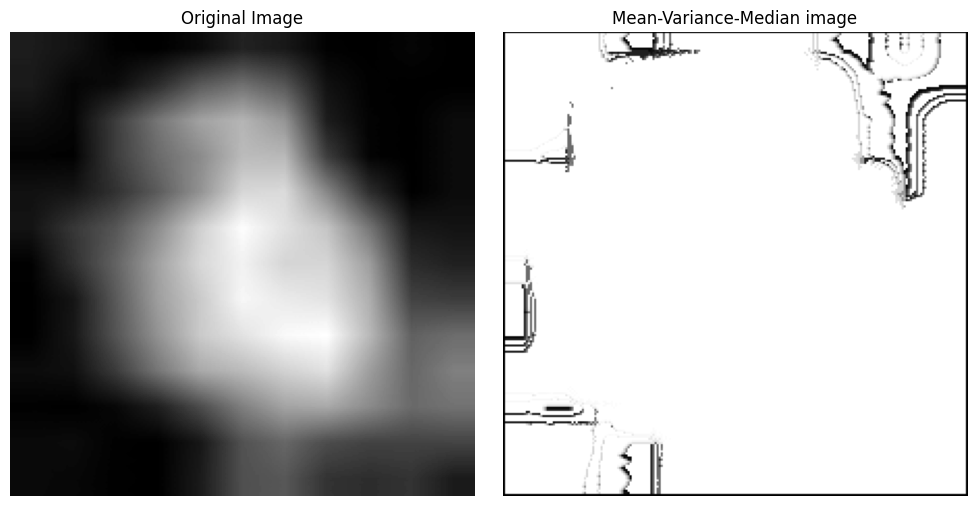

In [31]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def calculate_mmv_lbp(image, window_size=3):
    rows, cols = image.shape
    mmv_lbp_image = np.zeros((rows, cols), dtype=np.uint8)

    for i in range(1, rows - 1):
        for j in range(1, cols - 1):
            window = image[i - 1:i + 2, j - 1:j + 2]
            mean = np.mean(window)
            variance = np.var(window)
            median = np.median(window)
            
            # Calculate threshold
            threshold = (mean + np.sqrt(variance) + median) / 3

            
            binary_str = ''
            for x in range(3):
                for y in range(3):
                    if (x, y) != (1, 1):  # Exclude center pixel
                        binary_str += '1' if window[x, y] >= threshold else '0'

            
            lbp_value = int(binary_str, 2)
            mmv_lbp_image[i, j] = lbp_value

    return mmv_lbp_image

def display_results(original_image, pattern_image, title):
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(original_image, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    # Pattern Image
    plt.subplot(1, 2, 2)
    plt.imshow(pattern_image, cmap='gray')
    plt.title('Mean-Variance-Median image')
    plt.axis('off')

    plt.tight_layout()
    plt.show()


image_paths = [
    '/kaggle/input/trace-tumor-notebook/train/Benign/BreaDM-Be-1811/SUB1/p-028.jpg',
    '/kaggle/input/trace-tumor-notebook/train/Benign/BreaDM-Be-1811/SUB1/p-029.jpg',
    '/kaggle/input/trace-tumor-notebook/train/Benign/BreaDM-Be-1811/SUB1/p-030.jpg',
    '/kaggle/input/trace-tumor-notebook/train/Benign/BreaDM-Be-1811/SUB2/p-029.jpg',
    '/kaggle/input/trace-tumor-notebook/train/Benign/BreaDM-Be-1811/SUB2/p-030.jpg'
]

for image_path in image_paths:
   
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    
    image_resized = cv2.resize(image, (224, 224))
    
   
    mmv_lbp_image = calculate_mmv_lbp(image_resized)
    

    display_results(image_resized, mmv_lbp_image, 'Mean-Median-Variance LBP Image')

In [32]:
import numpy as np


image = np.array([
    [0, 1, 2, 3],
    [1, 0, 3, 2],
    [2, 3, 0, 1],
    [3, 2, 1, 0]
])

gray_levels = 4
distance = 1  
direction = (0, 1) 

glcm = np.zeros((gray_levels, gray_levels), dtype=int)

for i in range(image.shape[0]):
    for j in range(image.shape[1] - distance):
        
        current_pixel = image[i, j]
        
        neighbor_pixel = image[i, j + distance]
        
        glcm[current_pixel, neighbor_pixel] += 1

print("GLCM Matrix (Horizontal Distance 1):")
print(glcm)

GLCM Matrix (Horizontal Distance 1):
[[0 2 0 1]
 [2 0 1 0]
 [0 1 0 2]
 [1 0 2 0]]


In [33]:
import numpy as np

def compute_horizontal_glcm(matrix, gray_levels, distance=1):

    glcm = np.zeros((gray_levels, gray_levels), dtype=int)

    for i in range(matrix.shape[0]):
        for j in range(matrix.shape[1] - distance):
            current_pixel = matrix[i, j]
            neighbor_pixel = matrix[i, j + distance]
            glcm[current_pixel, neighbor_pixel] += 1

    return glcm



image = np.array([
    [0, 1, 2, 3],
    [1, 0, 3, 2],
    [2, 3, 0, 1],
    [3, 2, 1, 0]
])

gray_levels = 4 
distance = 1

glcm = compute_horizontal_glcm(image, gray_levels, distance)
print("GLCM Matrix ")
print(glcm)

GLCM Matrix 
[[0 2 0 1]
 [2 0 1 0]
 [0 1 0 2]
 [1 0 2 0]]


In [34]:
import cv2


image_path = '/kaggle/input/trace-tumor-notebook/train/Benign/BreaDM-Be-1811/SUB1/p-029.jpg'
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

image_resized = cv2.resize(image, (224, 224))


unique_gray_levels = np.unique(image_resized)
gray_levels = len(unique_gray_levels)
print("Number of gray levels:", gray_levels)


print("Image Matrix:")
print(image_resized)


glcm = compute_horizontal_glcm(image_resized, gray_levels)
print("GLCM Matrix (Horizontal Distance 1):")
print(glcm)

Number of gray levels: 49
Image Matrix:
[[ 0  0  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]
 ...
 [21 21 21 ...  0  0  0]
 [21 21 21 ...  0  0  0]
 [21 21 21 ...  0  0  0]]
GLCM Matrix (Horizontal Distance 1):
[[2043  154    0 ...    0    0    0]
 [ 147 2824  273 ...    0    0    0]
 [   0  261 3146 ...    0    0    0]
 ...
 [   0    0    0 ...   16    2    2]
 [   0    0    0 ...    6   14    1]
 [   0    0    0 ...    0    3    6]]


In [9]:
import torch
import torch.nn as nn
import torchvision.models as models

class my_model(nn.Module):
    def __init__(self, num_classes=2):
        super(my_model, self).__init__()

        vgg16 = models.vgg16(pretrained=True)


        self.features = vgg16.features
        self.avgpool = vgg16.avgpool


        self.classifier = nn.Sequential(
            nn.Linear(512 * 7 * 7, 4096),
            nn.ReLU(),
            nn.Dropout(),
            nn.Linear(4096, 4096),
            nn.ReLU(),
            nn.Dropout(),
            nn.Linear(4096, num_classes)
        )

    def forward(self, x):

        x = self.features(x)


        x = self.avgpool(x)

        x = torch.flatten(x, 1)

        x = self.classifier(x)

        return x

model = my_model(num_classes=2)


print(model)

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:02<00:00, 201MB/s] 


my_model(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilat

In [10]:
import torch
import torch.nn as nn
import torchvision.models as models

class Resnet50(nn.Module):
    def __init__(self, num_classes=2):
        super(Resnet50, self).__init__()
        model_resnet50 = models.resnet50(pretrained=True)
        
        # Copy layers from pretrained ResNet50
        self.conv1 = model_resnet50.conv1
        self.bn1 = model_resnet50.bn1
        self.relu = model_resnet50.relu
        self.maxpool = model_resnet50.maxpool
        self.layer1 = model_resnet50.layer1
        self.layer2 = model_resnet50.layer2
        self.layer3 = model_resnet50.layer3
        self.layer4 = model_resnet50.layer4
        self.avgpool = model_resnet50.avgpool
        
        # Replace the fully connected layer
        self.__features = model_resnet50.fc.in_features
        self.fc = nn.Linear(self.__features, num_classes)

    def forward(self, x):
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        x = self.avgpool(x)
        x = x.view(x.size(0), -1)
        x = self.fc(x)
        return x

In [11]:
class Resnet18(nn.Module):
    def __init__(self, num_classes=2):
        super(Resnet18, self). __init__()
        model_resnet18 = models.resnet18(pretrained=True)
        self.conv1 = model_resnet18.conv1  # convolutional function
        self.bn1 = model_resnet18.bn1  # batch normalization
        self.relu = model_resnet18.relu  # relu is your activation function
        self.maxpool = model_resnet18.maxpool  # maxpool is basically taking the biggest value per sub_matrix
        self.layer1 = model_resnet18.layer1
        self.layer2 = model_resnet18.layer2
        self.layer3 = model_resnet18.layer3
        self.layer4 = model_resnet18.layer4  # these layers are used for deepening the layers in architecture
        self.avgpool = model_resnet18.avgpool
        self. __features = model_resnet18.fc.in_features
        self.fc = nn.Linear(self.__features, num_classes)

    def forward(self, x):
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        x = self.avgpool(x)
        x = x.view(x.size(0) , -1)
        x = self.fc(x)
        return x

In [ ]:
print("Model is on device:", next(model_res18.parameters()).device)

In [39]:
import numpy as np
import torch

class EarlyStopping:

    def __init__(self, patience=7, verbose=False, delta=0, path='checkpoint.pt', trace_func=print):
        self.patience = patience
        self.verbose = verbose
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.val_loss_min = np.Inf
        self.delta = delta
        self.path = path
        self.trace_func = trace_func

    def __call__(self, val_loss, model):
        score = -val_loss

        if self.best_score is None:
            # First epoch case - save initial model
            self.best_score = score
            self.save_checkpoint(val_loss, model)

        elif score < self.best_score + self.delta:
            # No improvement in validation loss
            self.counter += 1
            if self.verbose:
                self.trace_func(f'EarlyStopping counter: {self.counter} out of {self.patience}')
            if self.counter >= self.patience:
                self.early_stop = True

        else:
            # Validation loss improved, save model and reset patience counter
            self.best_score = score
            self.save_checkpoint(val_loss, model)
            self.counter = 0

    def save_checkpoint(self, val_loss, model):
        if self.verbose:
            self.trace_func(f'Validation loss decreased ({self.val_loss_min:.6f} --> {val_loss:.6f}). Saving model...')
        torch.save(model.state_dict(), self.path)
        self.val_loss_min = val_loss


In [40]:
import torch
import numpy as np
from sklearn import metrics
from sklearn.metrics import roc_curve, auc, precision_score, recall_score, f1_score
import torch.nn.functional as F

def validation(model, val_loader):
    model.eval()  # Set model to evaluation mode
    test_loss = 0
    correct = 0
    all_predictions = []  # Store all predictions
    all_targets = []      # Store all targets
    possibilities = None  # Store probabilities for AUC

    for data, target in val_loader:
        if torch.cuda.is_available():
            data, target = data.cuda(), target.cuda()

        val_output = model(data)

In [41]:
import torch
import numpy as np
from sklearn import metrics
from sklearn.metrics import roc_curve, auc, precision_score, recall_score, f1_score
import torch.nn.functional as F

def validation(model, val_loader):
    model.eval()  # Set model to evaluation mode
    test_loss = 0
    correct = 0
    all_predictions = []  # Store all predictions
    all_targets = []      # Store all targets
    possibilities = None  # Store probabilities for AUC

    for data, target in val_loader:
        if torch.cuda.is_available():
            data, target = data.cuda(), target.cuda()

        val_output = model(data)

        # Calculate test loss
        test_loss += F.nll_loss(F.log_softmax(val_output, dim=1), target, reduction='sum').item()

        # Get predictions and accumulate them
        pred = val_output.data.max(1)[1]
        all_predictions.extend(pred.cpu().numpy())  # Collect all predictions
        all_targets.extend(target.cpu().numpy())    # Collect all target labels

        # Calculate probabilities for AUC
        possibility = F.softmax(val_output, dim=1).cpu().detach().numpy()
        if possibilities is None:
            possibilities = possibility
        else:
            possibilities = np.concatenate((possibilities, possibility), axis=0)

        # Calculate the number of correct predictions
        correct += pred.eq(target.data.view_as(pred)).cpu().sum()

    # Compute confusion matrix
    cm = metrics.confusion_matrix(all_targets, all_predictions)

    # One-hot encode the labels for AUC computation
    num_classes = val_output.shape[1]
    label_onehot = np.eye(num_classes)[np.array(all_targets).astype(int)]

    # Compute ROC curve and AUC
    fpr, tpr, thresholds = roc_curve(label_onehot.ravel(), possibilities.ravel())
    auc_value = auc(fpr, tpr)

    # Average test loss per sample
    test_loss /= len(val_loader.dataset)

    # Calculate sensitivity and specificity
    specificity = 1 - fpr[1] if len(fpr) > 1 else 0
    sensitivity = tpr[1] if len(tpr) > 1 else 0

    # Calculate additional metrics: Precision, Recall, and F1-Score
    precision = precision_score(all_targets, all_predictions, average='binary')  # For binary classification
    recall = recall_score(all_targets, all_predictions, average='binary')        # For binary classification
    f1 = f1_score(all_targets, all_predictions, average='binary')                # For binary classification

    print('Specificity: {:.4f}, Sensitivity: {:.4f}, AUC: {:.4f}'.format(specificity, sensitivity, auc_value))
    print('Precision: {:.4f}, Recall: {:.4f}, F1-Score: {:.4f}'.format(precision, recall, f1))
    print('\nTest set: Average loss: {:.4f}, Accuracy: {:.2f}%\n'.format(test_loss, 100. * correct / len(val_loader.dataset)))

    return test_loss, 100. * correct / len(val_loader.dataset), cm, auc_value, precision, recall, f1

In [42]:
import torch
import torch.nn.functional as F
from tqdm import tqdm

def train(epoch, model, num_epochs, loader, criterion, l2_decay, lr):
    # Calculate learning rate decay
    learning_rate = max(lr * (0.1 ** (epoch // 10)), 1e-5)
    optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate, momentum=0.9, weight_decay=l2_decay)

    model.train()  # Set model to training mode

    correct = 0
    for data, label in tqdm(loader, desc=f'Epoch {epoch + 1}/{num_epochs}', unit='batch'):
        data, label = data.float().to(device), label.long().to(device)  # Move data and labels to device

        optimizer.zero_grad()
        output = model(data)
        loss = F.nll_loss(F.log_softmax(output, dim=1), label)  # Use log softmax for output
        loss.backward()
        optimizer.step()

        # Calculate number of correct predictions
        pred = output.argmax(dim=1, keepdim=True)  # Get the index of the max log-probability
        correct += pred.eq(label.view_as(pred)).sum().item()  # Compare with true labels

    # Calculate accuracy
    accuracy = 100. * correct / len(loader.dataset)
    print(f'Train Accuracy: {accuracy:.2f}%')

In [43]:
total_epochs = 50
lr = 0.01
momentum = 0.9
no_cuda = False
num_classes = 2
log_interval = 10
l2_decay = 0.01
criterian=nn.CrossEntropyLoss()

# Initialize model
model = my_model(num_classes=num_classes)
model = model.to(device)  # Move model to the appropriate device (CPU or CUDA)

print(model)  # Optional: To print the model architecture

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


my_model(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilat

In [44]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)

In [45]:
# Check the device of the model by printing the device of its first parameter
print("Model is on device:", next(model.parameters()).device)

Model is on device: cuda:0


In [63]:
def plot_auc(fpr, tpr, auc_value):
    plt.figure()
    plt.plot(fpr, tpr, color="darkorange", lw=2, label="ROC curve (area = {:.2f})".format(auc_value))
    plt.plot([0, 1], [0, 1], color="navy", lw=2, linestyle="--")
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("Receiver Operating Characteristic")
    plt.legend(loc="lower right")
    plt.show()


def plot_confusion_matrix(cm, class_names):
    plt.figure(figsize=(6, 6))
    plt.imshow(cm, interpolation="nearest", cmap=plt.cm.Blues)
    plt.title("Confusion Matrix")
    plt.colorbar()
    tick_marks = np.arange(len(class_names))
    plt.xticks(tick_marks, class_names, rotation=45)
    plt.yticks(tick_marks, class_names)

    thresh = cm.max() / 2
    for i, j in np.ndindex(cm.shape):
        plt.text(j, i, format(cm[i, j], "d"), horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel("True label")
    plt.xlabel("Predicted label")
    plt.tight_layout()
    plt.show()

In [69]:
def test(model, test_dataloader):
    model.eval()
    len_test_dataloader = len(test_dataloader.dataset)

    test_loss = 0
    correct = 0
    possibilities = None
    all_predictions = []
    all_targets = []
    labels = ['benign', 'malignant']

    for data, target in test_dataloader:
        if torch.cuda.is_available():
            data, target = data.cuda(), target.cuda()

        test_output = model(data)
        test_loss += F.nll_loss(F.log_softmax(test_output, dim=1), target, reduction='sum').item()

        pred = test_output.data.max(1)[1]
        all_predictions.append(pred.cpu().numpy())
        all_targets.append(target.cpu().numpy())

        possibility = F.softmax(test_output, dim=1).cpu().data.numpy()
        if possibilities is None:
            possibilities = possibility
        else:
            possibilities = np.concatenate((possibilities, possibility), axis=0)

        correct += pred.eq(target.data.view_as(pred)).cpu().sum()

    all_predictions = np.concatenate(all_predictions)
    all_targets = np.concatenate(all_targets)

    # Classification metrics -> accuracy, F1-score
    print(metrics.classification_report(all_targets, all_predictions, target_names=labels, digits=4))

    # Confusion matrix
    cm = metrics.confusion_matrix(all_targets, all_predictions)
    plot_confusion_matrix(cm, class_names=labels)

    # ROC and AUC
    num_classes = test_output.shape[1]
    label_onehot = np.eye(num_classes)[all_targets]
    fpr, tpr, _ = roc_curve(label_onehot.ravel(), possibilities.ravel())
    auc_value = roc_auc_score(label_onehot, possibilities, average="macro")
    plot_auc(fpr, tpr, auc_value)

    test_loss /= len_test_dataloader
    print('Specificity: {:.4f}, Sensitivity: {:.4f}, AUC: {:.4f}'.format(1 - fpr[0], tpr[0], auc_value))
    print('\nTest set: Average loss: {:.4f}, Accuracy: {}/{} ({:.2f}%)\n'.format(
        test_loss, correct, len_test_dataloader, 100. * correct / len_test_dataloader))

    return 100. * correct / len_test_dataloader, test_loss, auc_value

In [66]:
# Check if CUDA is available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Move the model to the selected device (GPU or CPU)
model = model.to(device)

# Assuming test_loader is your test dataloader
model.eval()  # Set the model to evaluation mode

# Iterate through the test dataset
for data, target in test_loader:
    data, target = data.to(device), target.to(device)  # Move data to the same device as the model
    
    # Get the model's output
    output = model(data)
    # Perform your evaluation here (e.g., calculating loss, accuracy, etc.)

In [64]:
# Corrected code to load the model checkpoint
model = my_model()  # Replace this with your model class
model_path = '/kaggle/input/vgg16-best/pytorch/default/1/vgg16_best (2).pth'  # Path to your saved model
model.load_state_dict(torch.load(model_path))  # Load the model state dict
model.eval()  # Set the model to evaluation mode

/tmp/ipykernel_30/3577802714.py:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path))  # Load the model state dict


my_model(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilat

              precision    recall  f1-score   support

      benign     0.6268    0.3328    0.4348      1938
   malignant     0.7779    0.9218    0.8438      4913

    accuracy                         0.7552      6851
   macro avg     0.7024    0.6273    0.6393      6851
weighted avg     0.7352    0.7552    0.7281      6851



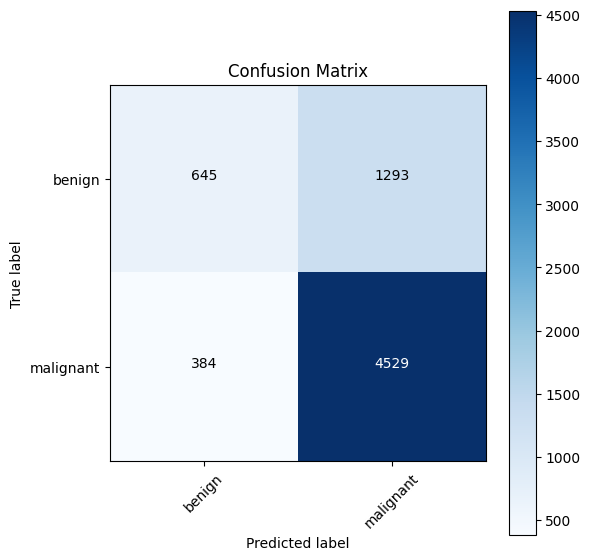

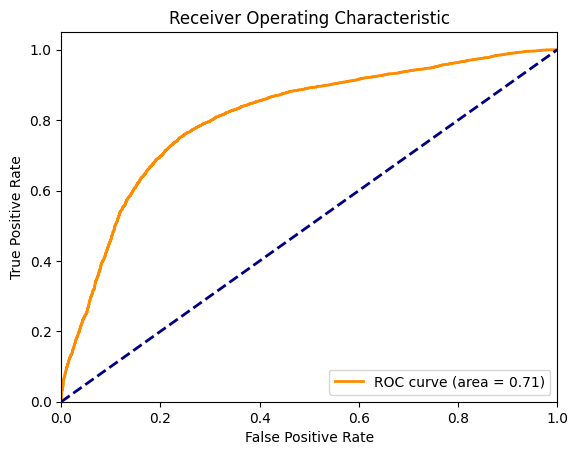

Specificity: 1.0000, Sensitivity: 0.0000, AUC: 0.7140

Test set: Average loss: 0.7387, Accuracy: 5174/6851 (75.52%)



In [70]:
# Assuming model and test_dataloader are already defined and loaded
test_accuracy, test_loss, test_auc = test(model, test_loader)

In [75]:
total_epochs = 50
lr = 0.01
momentum = 0.9
no_cuda = False
num_classes = 2
log_interval = 10
l2_decay = 0.01
criterian = nn.CrossEntropyLoss()

# Initialize model
model_res50 = Resnet50(num_classes=num_classes)  # Renaming my_model to model_res50
model_res50 = model_res50.to(device)  # Move model to the appropriate device (CPU or CUDA)

print(model_res50)  # Optional: To print the model architecture

Resnet50(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1

In [56]:
print("Model is on device:", next(model_res50.parameters()).device)

Model is on device: cuda:0


In [57]:

import os
import torch
import torch.nn as nn

# Ensure model is on the right device
model_res50.to(device)

best_accuracy = 0
early_stop = EarlyStopping(patience=20, verbose=True)

project_name = 'tumor_classification'
model_name = 'resnet50'

# Define model save directory
model_save_dir = os.path.join("/kaggle/working", project_name, model_name)
if not os.path.exists(model_save_dir):
    os.makedirs(model_save_dir)
    print(f"Model save directory created: {model_save_dir}")

# Training loop with model saving
for epoch in range(1, total_epochs + 1):
    print(f"Epoch {epoch}/{total_epochs}")

    # Training phase
    train(epoch, model_res50, total_epochs, train_loader, criterian, l2_decay, lr)

    # Validation phase (without gradients)
    with torch.no_grad():
        test_loss, accuracy, cm, auc_value, precision, recall, f1 = validation(model_res50, val_loader)

        # Print confusion matrix
        print("Confusion Matrix:")
        print(cm)

    # Handle multi-GPU state dict if applicable
    state_dict = model_res50.module.state_dict() if isinstance(model_res50, nn.parallel.DistributedDataParallel) else model_res50.state_dict()

    # Save the best model
    if auc_value > best_accuracy:
        best_accuracy = auc_value
        best_model_path = os.path.join(model_save_dir, f'{model_name}_best.pth')
        torch.save(state_dict, best_model_path, _use_new_zipfile_serialization=False)
        print(f"Best model saved to: {best_model_path}")

    # Save model checkpoint for the current epoc
    epoch_model_path = os.path.join(model_save_dir, f'{model_name}_epoch_{epoch}.pth')
    torch.save(state_dict, epoch_model_path, _use_new_zipfile_serialization=False)
    print(f"Model checkpoint saved to: {epoch_model_path}")

    # Early stopping check
    early_stop(test_loss, model_res50)
    if early_stop.early_stop:
        print("Early stopping")
        break
        
        

Model save directory created: /kaggle/working/tumor_classification/resnet50
Epoch 1/50


Epoch 2/50: 100%|██████████| 639/639 [02:38<00:00,  4.03batch/s]


Train Accuracy: 86.78%
Specificity: 1.0000, Sensitivity: 0.0005, AUC: 0.8031
Precision: 0.9116, Recall: 0.7046, F1-Score: 0.7949

Test set: Average loss: 0.5876, Accuracy: 71.09%

Confusion Matrix:
[[ 300  108]
 [ 467 1114]]
Best model saved to: /kaggle/working/tumor_classification/resnet50/resnet50_best.pth
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet50/resnet50_epoch_1.pth
Validation loss decreased (inf --> 0.587645). Saving model...
Epoch 2/50


Epoch 3/50: 100%|██████████| 639/639 [02:37<00:00,  4.07batch/s]


Train Accuracy: 91.97%
Specificity: 1.0000, Sensitivity: 0.0005, AUC: 0.5741
Precision: 0.8349, Recall: 0.5180, F1-Score: 0.6393

Test set: Average loss: 0.9398, Accuracy: 53.54%

Confusion Matrix:
[[246 162]
 [762 819]]
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet50/resnet50_epoch_2.pth
EarlyStopping counter: 1 out of 20
Epoch 3/50


Epoch 4/50: 100%|██████████| 639/639 [02:37<00:00,  4.06batch/s]


Train Accuracy: 92.16%
Specificity: 1.0000, Sensitivity: 0.0005, AUC: 0.9181
Precision: 0.8857, Recall: 0.8773, F1-Score: 0.8815

Test set: Average loss: 0.3789, Accuracy: 81.25%

Confusion Matrix:
[[ 229  179]
 [ 194 1387]]
Best model saved to: /kaggle/working/tumor_classification/resnet50/resnet50_best.pth
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet50/resnet50_epoch_3.pth
Validation loss decreased (0.587645 --> 0.378924). Saving model...
Epoch 4/50


Epoch 5/50: 100%|██████████| 639/639 [02:38<00:00,  4.03batch/s]


Train Accuracy: 92.66%
Specificity: 1.0000, Sensitivity: 0.0005, AUC: 0.9368
Precision: 0.9044, Recall: 0.9273, F1-Score: 0.9157

Test set: Average loss: 0.3670, Accuracy: 86.43%

Confusion Matrix:
[[ 253  155]
 [ 115 1466]]
Best model saved to: /kaggle/working/tumor_classification/resnet50/resnet50_best.pth
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet50/resnet50_epoch_4.pth
Validation loss decreased (0.378924 --> 0.366960). Saving model...
Epoch 5/50


Epoch 6/50: 100%|██████████| 639/639 [02:38<00:00,  4.02batch/s]


Train Accuracy: 93.27%
Specificity: 1.0000, Sensitivity: 0.0005, AUC: 0.8406
Precision: 0.8816, Recall: 0.8381, F1-Score: 0.8593

Test set: Average loss: 0.6158, Accuracy: 78.18%

Confusion Matrix:
[[ 230  178]
 [ 256 1325]]
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet50/resnet50_epoch_5.pth
EarlyStopping counter: 1 out of 20
Epoch 6/50


Epoch 7/50: 100%|██████████| 639/639 [02:38<00:00,  4.04batch/s]


Train Accuracy: 93.83%
Specificity: 1.0000, Sensitivity: 0.0005, AUC: 0.7761
Precision: 0.9349, Recall: 0.6907, F1-Score: 0.7945

Test set: Average loss: 0.7196, Accuracy: 71.59%

Confusion Matrix:
[[ 332   76]
 [ 489 1092]]
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet50/resnet50_epoch_6.pth
EarlyStopping counter: 2 out of 20
Epoch 7/50


Epoch 8/50: 100%|██████████| 639/639 [02:39<00:00,  4.01batch/s]


Train Accuracy: 94.48%
Specificity: 1.0000, Sensitivity: 0.0005, AUC: 0.5894
Precision: 0.9453, Recall: 0.4813, F1-Score: 0.6379

Test set: Average loss: 1.1040, Accuracy: 56.56%

Confusion Matrix:
[[364  44]
 [820 761]]
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet50/resnet50_epoch_7.pth
EarlyStopping counter: 3 out of 20
Epoch 8/50


Epoch 9/50: 100%|██████████| 639/639 [02:38<00:00,  4.02batch/s]


Train Accuracy: 94.34%
Specificity: 1.0000, Sensitivity: 0.0005, AUC: 0.9015
Precision: 0.8540, Recall: 0.9583, F1-Score: 0.9031

Test set: Average loss: 0.4402, Accuracy: 83.66%

Confusion Matrix:
[[ 149  259]
 [  66 1515]]
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet50/resnet50_epoch_8.pth
EarlyStopping counter: 4 out of 20
Epoch 9/50


Epoch 10/50: 100%|██████████| 639/639 [02:38<00:00,  4.02batch/s]


Train Accuracy: 94.82%
Specificity: 1.0000, Sensitivity: 0.0005, AUC: 0.8666
Precision: 0.9064, Recall: 0.8027, F1-Score: 0.8514

Test set: Average loss: 0.5611, Accuracy: 77.73%

Confusion Matrix:
[[ 277  131]
 [ 312 1269]]
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet50/resnet50_epoch_9.pth
EarlyStopping counter: 5 out of 20
Epoch 10/50


Epoch 11/50: 100%|██████████| 639/639 [02:38<00:00,  4.03batch/s]


Train Accuracy: 99.04%
Specificity: 1.0000, Sensitivity: 0.0005, AUC: 0.8693
Precision: 0.9295, Recall: 0.7584, F1-Score: 0.8352

Test set: Average loss: 0.5774, Accuracy: 76.22%

Confusion Matrix:
[[ 317   91]
 [ 382 1199]]
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet50/resnet50_epoch_10.pth
EarlyStopping counter: 6 out of 20
Epoch 11/50


Epoch 12/50: 100%|██████████| 639/639 [02:38<00:00,  4.04batch/s]


Train Accuracy: 99.71%
Specificity: 1.0000, Sensitivity: 0.0005, AUC: 0.8891
Precision: 0.9197, Recall: 0.8261, F1-Score: 0.8704

Test set: Average loss: 0.5192, Accuracy: 80.44%

Confusion Matrix:
[[ 294  114]
 [ 275 1306]]
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet50/resnet50_epoch_11.pth
EarlyStopping counter: 7 out of 20
Epoch 12/50


Epoch 13/50: 100%|██████████| 639/639 [02:38<00:00,  4.04batch/s]


Train Accuracy: 99.79%
Specificity: 1.0000, Sensitivity: 0.0005, AUC: 0.8661
Precision: 0.9327, Recall: 0.7710, F1-Score: 0.8442

Test set: Average loss: 0.6085, Accuracy: 77.38%

Confusion Matrix:
[[ 320   88]
 [ 362 1219]]
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet50/resnet50_epoch_12.pth
EarlyStopping counter: 8 out of 20
Epoch 13/50


Epoch 14/50: 100%|██████████| 639/639 [02:37<00:00,  4.06batch/s]


Train Accuracy: 99.88%
Specificity: 1.0000, Sensitivity: 0.0005, AUC: 0.8970
Precision: 0.9191, Recall: 0.8406, F1-Score: 0.8781

Test set: Average loss: 0.5109, Accuracy: 81.45%

Confusion Matrix:
[[ 291  117]
 [ 252 1329]]
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet50/resnet50_epoch_13.pth
EarlyStopping counter: 9 out of 20
Epoch 14/50


Epoch 15/50: 100%|██████████| 639/639 [02:37<00:00,  4.05batch/s]


Train Accuracy: 99.89%
Specificity: 1.0000, Sensitivity: 0.0005, AUC: 0.8824
Precision: 0.9272, Recall: 0.7900, F1-Score: 0.8531

Test set: Average loss: 0.5488, Accuracy: 78.38%

Confusion Matrix:
[[ 310   98]
 [ 332 1249]]
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet50/resnet50_epoch_14.pth
EarlyStopping counter: 10 out of 20
Epoch 15/50


Epoch 16/50: 100%|██████████| 639/639 [02:36<00:00,  4.08batch/s]


Train Accuracy: 99.82%
Specificity: 1.0000, Sensitivity: 0.0005, AUC: 0.8934
Precision: 0.9123, Recall: 0.8292, F1-Score: 0.8688

Test set: Average loss: 0.5144, Accuracy: 80.09%

Confusion Matrix:
[[ 282  126]
 [ 270 1311]]
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet50/resnet50_epoch_15.pth
EarlyStopping counter: 11 out of 20
Epoch 16/50


Epoch 17/50: 100%|██████████| 639/639 [02:37<00:00,  4.07batch/s]


Train Accuracy: 99.94%
Specificity: 1.0000, Sensitivity: 0.0005, AUC: 0.8896
Precision: 0.9212, Recall: 0.8280, F1-Score: 0.8721

Test set: Average loss: 0.5447, Accuracy: 80.69%

Confusion Matrix:
[[ 296  112]
 [ 272 1309]]
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet50/resnet50_epoch_16.pth
EarlyStopping counter: 12 out of 20
Epoch 17/50


Epoch 18/50: 100%|██████████| 639/639 [02:37<00:00,  4.05batch/s]


Train Accuracy: 99.89%
Specificity: 1.0000, Sensitivity: 0.0005, AUC: 0.8655
Precision: 0.9252, Recall: 0.7672, F1-Score: 0.8389

Test set: Average loss: 0.6180, Accuracy: 76.57%

Confusion Matrix:
[[ 310   98]
 [ 368 1213]]
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet50/resnet50_epoch_17.pth
EarlyStopping counter: 13 out of 20
Epoch 18/50


Epoch 19/50: 100%|██████████| 639/639 [02:38<00:00,  4.03batch/s]


Train Accuracy: 99.91%
Specificity: 1.0000, Sensitivity: 0.0005, AUC: 0.8793
Precision: 0.9239, Recall: 0.7830, F1-Score: 0.8477

Test set: Average loss: 0.5631, Accuracy: 77.63%

Confusion Matrix:
[[ 306  102]
 [ 343 1238]]
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet50/resnet50_epoch_18.pth
EarlyStopping counter: 14 out of 20
Epoch 19/50


Epoch 20/50: 100%|██████████| 639/639 [02:37<00:00,  4.06batch/s]


Train Accuracy: 99.76%
Specificity: 0.9995, Sensitivity: 0.0000, AUC: 0.8814
Precision: 0.8723, Recall: 0.8988, F1-Score: 0.8854

Test set: Average loss: 0.5531, Accuracy: 81.50%

Confusion Matrix:
[[ 200  208]
 [ 160 1421]]
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet50/resnet50_epoch_19.pth
EarlyStopping counter: 15 out of 20
Epoch 20/50


Epoch 21/50: 100%|██████████| 639/639 [02:39<00:00,  4.01batch/s]


Train Accuracy: 99.93%
Specificity: 1.0000, Sensitivity: 0.0005, AUC: 0.8771
Precision: 0.9238, Recall: 0.7976, F1-Score: 0.8561

Test set: Average loss: 0.5657, Accuracy: 78.68%

Confusion Matrix:
[[ 304  104]
 [ 320 1261]]
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet50/resnet50_epoch_20.pth
EarlyStopping counter: 16 out of 20
Epoch 21/50


Epoch 22/50: 100%|██████████| 639/639 [02:36<00:00,  4.09batch/s]


Train Accuracy: 99.97%
Specificity: 1.0000, Sensitivity: 0.0005, AUC: 0.8685
Precision: 0.9216, Recall: 0.7805, F1-Score: 0.8452

Test set: Average loss: 0.5962, Accuracy: 77.28%

Confusion Matrix:
[[ 303  105]
 [ 347 1234]]
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet50/resnet50_epoch_21.pth
EarlyStopping counter: 17 out of 20
Epoch 22/50


Epoch 23/50: 100%|██████████| 639/639 [02:36<00:00,  4.08batch/s]


Train Accuracy: 99.98%
Specificity: 1.0000, Sensitivity: 0.0005, AUC: 0.8664
Precision: 0.9208, Recall: 0.7793, F1-Score: 0.8441

Test set: Average loss: 0.6116, Accuracy: 77.12%

Confusion Matrix:
[[ 302  106]
 [ 349 1232]]
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet50/resnet50_epoch_22.pth
EarlyStopping counter: 18 out of 20
Epoch 23/50


Epoch 24/50: 100%|██████████| 639/639 [02:39<00:00,  4.01batch/s]


Train Accuracy: 99.99%
Specificity: 1.0000, Sensitivity: 0.0005, AUC: 0.8705
Precision: 0.9172, Recall: 0.7913, F1-Score: 0.8496

Test set: Average loss: 0.5942, Accuracy: 77.73%

Confusion Matrix:
[[ 295  113]
 [ 330 1251]]
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet50/resnet50_epoch_23.pth
EarlyStopping counter: 19 out of 20
Epoch 24/50


Epoch 25/50: 100%|██████████| 639/639 [02:37<00:00,  4.06batch/s]


Train Accuracy: 99.99%
Specificity: 1.0000, Sensitivity: 0.0005, AUC: 0.8731
Precision: 0.9147, Recall: 0.7868, F1-Score: 0.8460

Test set: Average loss: 0.5846, Accuracy: 77.22%

Confusion Matrix:
[[ 292  116]
 [ 337 1244]]
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet50/resnet50_epoch_24.pth
EarlyStopping counter: 20 out of 20
Early stopping


In [78]:
# Check if CUDA is available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Move the model to the selected device (GPU or CPU)
model_res50 = model_res50.to(device)

# Assuming test_loader is your test dataloader
model.eval()  # Set the model to evaluation mode

# Iterate through the test dataset
for data, target in test_loader:
    data, target = data.to(device), target.to(device)  # Move data to the same device as the model
    
    # Get the model's output
    output = model_res50(data)
    # Perform your evaluation here (e.g., calculating loss, accuracy, etc.)

In [76]:
# Corrected code to load the model checkpoint
model_res50 = Resnet50()  # Replace this with your model class
model_path50 = '/kaggle/input/resnet50/pytorch/default/1/resnet50_best LATEST.pth'  # Path to your saved model
model_res50.load_state_dict(torch.load(model_path50))  # Load the model state dict
model_res50.eval()  # Set the model to evaluation mode

/tmp/ipykernel_30/3675884903.py:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model_res50.load_state_dict(torch.load(model_path))  # Load the model state dict


Resnet50(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1

              precision    recall  f1-score   support

      benign     0.5996    0.1445    0.2328      1938
   malignant     0.7403    0.9619    0.8367      4913

    accuracy                         0.7307      6851
   macro avg     0.6699    0.5532    0.5348      6851
weighted avg     0.7005    0.7307    0.6659      6851



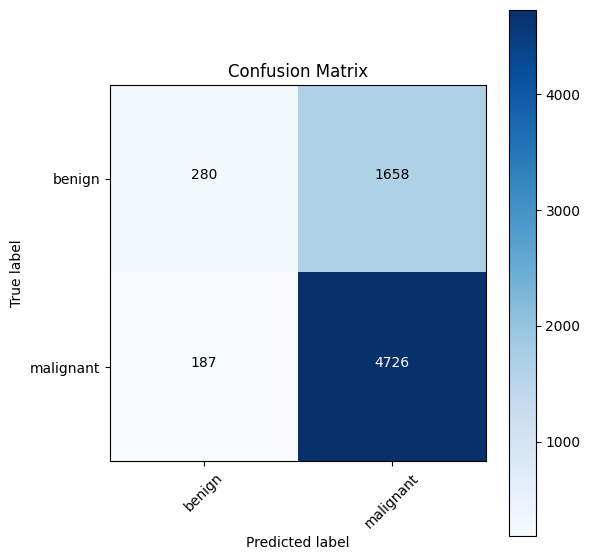

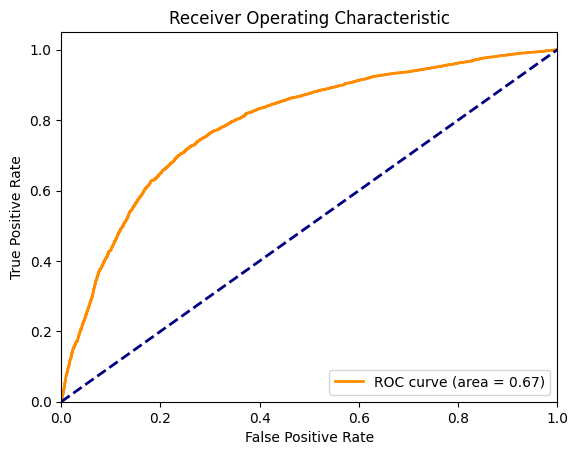

Specificity: 1.0000, Sensitivity: 0.0000, AUC: 0.6748

Test set: Average loss: 1.1253, Accuracy: 5006/6851 (73.07%)



In [84]:
# Assuming model and test_dataloader are already defined and loaded
test_accuracy_50, test_loss_50, test_auc_50 = test(model_res50, test_loader)

In [80]:
total_epochs = 50
lr = 0.01
momentum = 0.9
no_cuda = False
num_classes = 2
log_interval = 10
l2_decay = 0.01
criterian = nn.CrossEntropyLoss()

# Initialize model
model_res18 = Resnet18(num_classes=num_classes)  # Renaming my_model to model_res50
model_res18 = model_res18.to(device)  # Move model to the appropriate device (CPU or CUDA)

print(model_res18)  # Optional: To print the model architecture

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Resnet18(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)


In [81]:
print("Model is on device:", next(model_res18.parameters()).device)

Model is on device: cuda:0


In [82]:

import os
import torch
import torch.nn as nn

# Ensure model is on the right device
model_res18.to(device)

best_accuracy = 0
early_stop = EarlyStopping(patience=20, verbose=True)

project_name = 'tumor_classification'
model_name = 'resnet18'

# Define model save directory
model_save_dir = os.path.join("/kaggle/working", project_name, model_name)
if not os.path.exists(model_save_dir):
    os.makedirs(model_save_dir)
    print(f"Model save directory created: {model_save_dir}")

# Training loop with model saving
for epoch in range(1, total_epochs + 1):
    print(f"Epoch {epoch}/{total_epochs}")

    # Training phase
    train(epoch, model_res18, total_epochs, train_loader, criterian, l2_decay, lr)

    # Validation phase (without gradients)
    with torch.no_grad():
        test_loss, accuracy, cm, auc_value, precision, recall, f1 = validation(model_res18, val_loader)

        # Print confusion matrix
        print("Confusion Matrix:")
        print(cm)

    # Handle multi-GPU state dict if applicable
    state_dict = model_res18.module.state_dict() if isinstance(model_res18, nn.parallel.DistributedDataParallel) else model_res18.state_dict()

    # Save the best model
    if auc_value > best_accuracy:
        best_accuracy = auc_value
        best_model_path = os.path.join(model_save_dir, f'{model_name}_best.pth')
        torch.save(state_dict, best_model_path, _use_new_zipfile_serialization=False)
        print(f"Best model saved to: {best_model_path}")

    # Save model checkpoint for the current epoc
    epoch_model_path = os.path.join(model_save_dir, f'{model_name}_epoch_{epoch}.pth')
    torch.save(state_dict, epoch_model_path, _use_new_zipfile_serialization=False)
    print(f"Model checkpoint saved to: {epoch_model_path}")

    # Early stopping check
    early_stop(test_loss, model_res18)
    if early_stop.early_stop:
        print("Early stopping")
        break
        
        

Model save directory created: /kaggle/working/tumor_classification/resnet18
Epoch 1/50


Epoch 2/50: 100%|██████████| 639/639 [01:45<00:00,  6.03batch/s]


Train Accuracy: 87.46%
Specificity: 1.0000, Sensitivity: 0.0010, AUC: 0.7347
Precision: 0.9399, Recall: 0.6331, F1-Score: 0.7566

Test set: Average loss: 0.8531, Accuracy: 67.62%

Confusion Matrix:
[[ 344   64]
 [ 580 1001]]
Best model saved to: /kaggle/working/tumor_classification/resnet18/resnet18_best.pth
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet18/resnet18_epoch_1.pth
Validation loss decreased (inf --> 0.853135). Saving model...
Epoch 2/50


Epoch 3/50: 100%|██████████| 639/639 [01:25<00:00,  7.47batch/s]


Train Accuracy: 93.85%
Specificity: 1.0000, Sensitivity: 0.0015, AUC: 0.9029
Precision: 0.9388, Recall: 0.8058, F1-Score: 0.8673

Test set: Average loss: 0.3921, Accuracy: 80.39%

Confusion Matrix:
[[ 325   83]
 [ 307 1274]]
Best model saved to: /kaggle/working/tumor_classification/resnet18/resnet18_best.pth
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet18/resnet18_epoch_2.pth
Validation loss decreased (0.853135 --> 0.392066). Saving model...
Epoch 3/50


Epoch 4/50: 100%|██████████| 639/639 [01:22<00:00,  7.78batch/s]


Train Accuracy: 94.51%
Specificity: 1.0000, Sensitivity: 0.0005, AUC: 0.9281
Precision: 0.9360, Recall: 0.8596, F1-Score: 0.8961

Test set: Average loss: 0.3873, Accuracy: 84.16%

Confusion Matrix:
[[ 315   93]
 [ 222 1359]]
Best model saved to: /kaggle/working/tumor_classification/resnet18/resnet18_best.pth
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet18/resnet18_epoch_3.pth
Validation loss decreased (0.392066 --> 0.387278). Saving model...
Epoch 4/50


Epoch 5/50: 100%|██████████| 639/639 [01:22<00:00,  7.76batch/s]


Train Accuracy: 95.94%
Specificity: 1.0000, Sensitivity: 0.0005, AUC: 0.9366
Precision: 0.9504, Recall: 0.8602, F1-Score: 0.9031

Test set: Average loss: 0.3402, Accuracy: 85.32%

Confusion Matrix:
[[ 337   71]
 [ 221 1360]]
Best model saved to: /kaggle/working/tumor_classification/resnet18/resnet18_best.pth
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet18/resnet18_epoch_4.pth
Validation loss decreased (0.387278 --> 0.340173). Saving model...
Epoch 5/50


Epoch 6/50: 100%|██████████| 639/639 [01:23<00:00,  7.61batch/s]


Train Accuracy: 96.35%
Specificity: 1.0000, Sensitivity: 0.0005, AUC: 0.9069
Precision: 0.9277, Recall: 0.8520, F1-Score: 0.8882

Test set: Average loss: 0.4044, Accuracy: 82.96%

Confusion Matrix:
[[ 303  105]
 [ 234 1347]]
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet18/resnet18_epoch_5.pth
EarlyStopping counter: 1 out of 20
Epoch 6/50


Epoch 7/50: 100%|██████████| 639/639 [01:23<00:00,  7.62batch/s]


Train Accuracy: 97.00%
Specificity: 1.0000, Sensitivity: 0.0005, AUC: 0.9511
Precision: 0.9158, Recall: 0.9285, F1-Score: 0.9221

Test set: Average loss: 0.2858, Accuracy: 87.53%

Confusion Matrix:
[[ 273  135]
 [ 113 1468]]
Best model saved to: /kaggle/working/tumor_classification/resnet18/resnet18_best.pth
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet18/resnet18_epoch_6.pth
Validation loss decreased (0.340173 --> 0.285772). Saving model...
Epoch 7/50


Epoch 8/50: 100%|██████████| 639/639 [01:23<00:00,  7.65batch/s]


Train Accuracy: 97.06%
Specificity: 1.0000, Sensitivity: 0.0005, AUC: 0.8762
Precision: 0.9562, Recall: 0.8008, F1-Score: 0.8716

Test set: Average loss: 0.5486, Accuracy: 81.25%

Confusion Matrix:
[[ 350   58]
 [ 315 1266]]
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet18/resnet18_epoch_7.pth
EarlyStopping counter: 1 out of 20
Epoch 8/50


Epoch 9/50: 100%|██████████| 639/639 [01:23<00:00,  7.62batch/s]


Train Accuracy: 97.04%
Specificity: 1.0000, Sensitivity: 0.0005, AUC: 0.8525
Precision: 0.8775, Recall: 0.8292, F1-Score: 0.8527

Test set: Average loss: 0.5642, Accuracy: 77.22%

Confusion Matrix:
[[ 225  183]
 [ 270 1311]]
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet18/resnet18_epoch_8.pth
EarlyStopping counter: 2 out of 20
Epoch 9/50


Epoch 10/50: 100%|██████████| 639/639 [01:24<00:00,  7.60batch/s]


Train Accuracy: 97.69%
Specificity: 1.0000, Sensitivity: 0.0005, AUC: 0.9156
Precision: 0.8561, Recall: 0.9298, F1-Score: 0.8914

Test set: Average loss: 0.4530, Accuracy: 82.00%

Confusion Matrix:
[[ 161  247]
 [ 111 1470]]
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet18/resnet18_epoch_9.pth
EarlyStopping counter: 3 out of 20
Epoch 10/50


Epoch 11/50: 100%|██████████| 639/639 [01:22<00:00,  7.75batch/s]


Train Accuracy: 99.72%
Specificity: 0.9995, Sensitivity: 0.0000, AUC: 0.9091
Precision: 0.9347, Recall: 0.8956, F1-Score: 0.9147

Test set: Average loss: 0.4347, Accuracy: 86.73%

Confusion Matrix:
[[ 309   99]
 [ 165 1416]]
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet18/resnet18_epoch_10.pth
EarlyStopping counter: 4 out of 20
Epoch 11/50


Epoch 12/50: 100%|██████████| 639/639 [01:22<00:00,  7.73batch/s]


Train Accuracy: 99.96%
Specificity: 0.9995, Sensitivity: 0.0000, AUC: 0.9043
Precision: 0.9293, Recall: 0.8899, F1-Score: 0.9092

Test set: Average loss: 0.4447, Accuracy: 85.87%

Confusion Matrix:
[[ 301  107]
 [ 174 1407]]
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet18/resnet18_epoch_11.pth
EarlyStopping counter: 5 out of 20
Epoch 12/50


Epoch 13/50: 100%|██████████| 639/639 [01:27<00:00,  7.30batch/s]


Train Accuracy: 99.99%
Specificity: 0.9995, Sensitivity: 0.0000, AUC: 0.9089
Precision: 0.9249, Recall: 0.8956, F1-Score: 0.9100

Test set: Average loss: 0.4340, Accuracy: 85.92%

Confusion Matrix:
[[ 293  115]
 [ 165 1416]]
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet18/resnet18_epoch_12.pth
EarlyStopping counter: 6 out of 20
Epoch 13/50


Epoch 14/50: 100%|██████████| 639/639 [01:25<00:00,  7.45batch/s]


Train Accuracy: 99.98%
Specificity: 0.9995, Sensitivity: 0.0000, AUC: 0.9104
Precision: 0.9148, Recall: 0.9096, F1-Score: 0.9121

Test set: Average loss: 0.4305, Accuracy: 86.07%

Confusion Matrix:
[[ 274  134]
 [ 143 1438]]
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet18/resnet18_epoch_13.pth
EarlyStopping counter: 7 out of 20
Epoch 14/50


Epoch 15/50: 100%|██████████| 639/639 [01:22<00:00,  7.73batch/s]


Train Accuracy: 99.96%
Specificity: 0.9995, Sensitivity: 0.0000, AUC: 0.9068
Precision: 0.9229, Recall: 0.8937, F1-Score: 0.9081

Test set: Average loss: 0.4409, Accuracy: 85.62%

Confusion Matrix:
[[ 290  118]
 [ 168 1413]]
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet18/resnet18_epoch_14.pth
EarlyStopping counter: 8 out of 20
Epoch 15/50


Epoch 16/50: 100%|██████████| 639/639 [01:23<00:00,  7.65batch/s]


Train Accuracy: 100.00%
Specificity: 0.9995, Sensitivity: 0.0000, AUC: 0.9131
Precision: 0.9336, Recall: 0.8988, F1-Score: 0.9159

Test set: Average loss: 0.4175, Accuracy: 86.88%

Confusion Matrix:
[[ 307  101]
 [ 160 1421]]
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet18/resnet18_epoch_15.pth
EarlyStopping counter: 9 out of 20
Epoch 16/50


Epoch 17/50: 100%|██████████| 639/639 [01:22<00:00,  7.73batch/s]


Train Accuracy: 100.00%
Specificity: 0.9995, Sensitivity: 0.0000, AUC: 0.9147
Precision: 0.9155, Recall: 0.9184, F1-Score: 0.9170

Test set: Average loss: 0.4103, Accuracy: 86.78%

Confusion Matrix:
[[ 274  134]
 [ 129 1452]]
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet18/resnet18_epoch_16.pth
EarlyStopping counter: 10 out of 20
Epoch 17/50


Epoch 18/50: 100%|██████████| 639/639 [01:24<00:00,  7.59batch/s]


Train Accuracy: 100.00%
Specificity: 0.9995, Sensitivity: 0.0000, AUC: 0.9261
Precision: 0.9150, Recall: 0.9197, F1-Score: 0.9174

Test set: Average loss: 0.3813, Accuracy: 86.83%

Confusion Matrix:
[[ 273  135]
 [ 127 1454]]
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet18/resnet18_epoch_17.pth
EarlyStopping counter: 11 out of 20
Epoch 18/50


Epoch 19/50: 100%|██████████| 639/639 [01:23<00:00,  7.61batch/s]


Train Accuracy: 100.00%
Specificity: 0.9995, Sensitivity: 0.0000, AUC: 0.9178
Precision: 0.9200, Recall: 0.9020, F1-Score: 0.9109

Test set: Average loss: 0.4026, Accuracy: 85.97%

Confusion Matrix:
[[ 284  124]
 [ 155 1426]]
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet18/resnet18_epoch_18.pth
EarlyStopping counter: 12 out of 20
Epoch 19/50


Epoch 20/50: 100%|██████████| 639/639 [01:23<00:00,  7.61batch/s]


Train Accuracy: 99.99%
Specificity: 0.9995, Sensitivity: 0.0000, AUC: 0.9141
Precision: 0.9362, Recall: 0.9007, F1-Score: 0.9181

Test set: Average loss: 0.4109, Accuracy: 87.23%

Confusion Matrix:
[[ 311   97]
 [ 157 1424]]
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet18/resnet18_epoch_19.pth
EarlyStopping counter: 13 out of 20
Epoch 20/50


Epoch 21/50: 100%|██████████| 639/639 [01:27<00:00,  7.34batch/s]


Train Accuracy: 100.00%
Specificity: 0.9995, Sensitivity: 0.0000, AUC: 0.9121
Precision: 0.9339, Recall: 0.8931, F1-Score: 0.9130

Test set: Average loss: 0.4139, Accuracy: 86.48%

Confusion Matrix:
[[ 308  100]
 [ 169 1412]]
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet18/resnet18_epoch_20.pth
EarlyStopping counter: 14 out of 20
Epoch 21/50


Epoch 22/50: 100%|██████████| 639/639 [01:28<00:00,  7.21batch/s]


Train Accuracy: 100.00%
Specificity: 0.9995, Sensitivity: 0.0000, AUC: 0.9246
Precision: 0.9165, Recall: 0.9228, F1-Score: 0.9196

Test set: Average loss: 0.3827, Accuracy: 87.18%

Confusion Matrix:
[[ 275  133]
 [ 122 1459]]
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet18/resnet18_epoch_21.pth
EarlyStopping counter: 15 out of 20
Epoch 22/50


Epoch 23/50: 100%|██████████| 639/639 [01:27<00:00,  7.29batch/s]


Train Accuracy: 100.00%
Specificity: 0.9995, Sensitivity: 0.0000, AUC: 0.9243
Precision: 0.9205, Recall: 0.9228, F1-Score: 0.9217

Test set: Average loss: 0.3856, Accuracy: 87.53%

Confusion Matrix:
[[ 282  126]
 [ 122 1459]]
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet18/resnet18_epoch_22.pth
EarlyStopping counter: 16 out of 20
Epoch 23/50


Epoch 24/50: 100%|██████████| 639/639 [01:22<00:00,  7.71batch/s]


Train Accuracy: 100.00%
Specificity: 0.9995, Sensitivity: 0.0000, AUC: 0.9285
Precision: 0.9059, Recall: 0.9317, F1-Score: 0.9186

Test set: Average loss: 0.3793, Accuracy: 86.88%

Confusion Matrix:
[[ 255  153]
 [ 108 1473]]
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet18/resnet18_epoch_23.pth
EarlyStopping counter: 17 out of 20
Epoch 24/50


Epoch 25/50: 100%|██████████| 639/639 [01:22<00:00,  7.72batch/s]


Train Accuracy: 100.00%
Specificity: 0.9995, Sensitivity: 0.0000, AUC: 0.9161
Precision: 0.9298, Recall: 0.9045, F1-Score: 0.9170

Test set: Average loss: 0.4056, Accuracy: 86.98%

Confusion Matrix:
[[ 300  108]
 [ 151 1430]]
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet18/resnet18_epoch_24.pth
EarlyStopping counter: 18 out of 20
Epoch 25/50


Epoch 26/50: 100%|██████████| 639/639 [01:22<00:00,  7.73batch/s]


Train Accuracy: 100.00%
Specificity: 0.9995, Sensitivity: 0.0000, AUC: 0.9140
Precision: 0.9329, Recall: 0.8969, F1-Score: 0.9145

Test set: Average loss: 0.4083, Accuracy: 86.68%

Confusion Matrix:
[[ 306  102]
 [ 163 1418]]
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet18/resnet18_epoch_25.pth
EarlyStopping counter: 19 out of 20
Epoch 26/50


Epoch 27/50: 100%|██████████| 639/639 [01:22<00:00,  7.71batch/s]


Train Accuracy: 100.00%
Specificity: 0.9995, Sensitivity: 0.0000, AUC: 0.9169
Precision: 0.9278, Recall: 0.9020, F1-Score: 0.9147

Test set: Average loss: 0.4034, Accuracy: 86.63%

Confusion Matrix:
[[ 297  111]
 [ 155 1426]]
Model checkpoint saved to: /kaggle/working/tumor_classification/resnet18/resnet18_epoch_26.pth
EarlyStopping counter: 20 out of 20
Early stopping


In [88]:
# Check if CUDA is available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Move the model to the selected device (GPU or CPU)
model_res18 = model_res18.to(device)

# Assuming test_loader is your test dataloader
model.eval()  # Set the model to evaluation mode

# Iterate through the test dataset
for data, target in test_loader:
    data, target = data.to(device), target.to(device)  # Move data to the same device as the model
    
    # Get the model's output
    output = model_res18(data)
    # Perform your evaluation here (e.g., calculating loss, accuracy, etc.)

In [85]:
# Corrected code to load the model checkpoint
model_res18 = Resnet18()  # Replace this with your model class
model_path18 = '/kaggle/input/resnet-18/pytorch/default/1/resnet18_best.pth'  # Path to your saved model
model_res18.load_state_dict(torch.load(model_path18))  # Load the model state dict
model_res18.eval()  # Set the model to evaluation mode

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/tmp/ipykernel_30/135238013.py:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details

Resnet18(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)


              precision    recall  f1-score   support

      benign     0.5308    0.2761    0.3632      1938
   malignant     0.7599    0.9037    0.8256      4913

    accuracy                         0.7262      6851
   macro avg     0.6453    0.5899    0.5944      6851
weighted avg     0.6951    0.7262    0.6948      6851



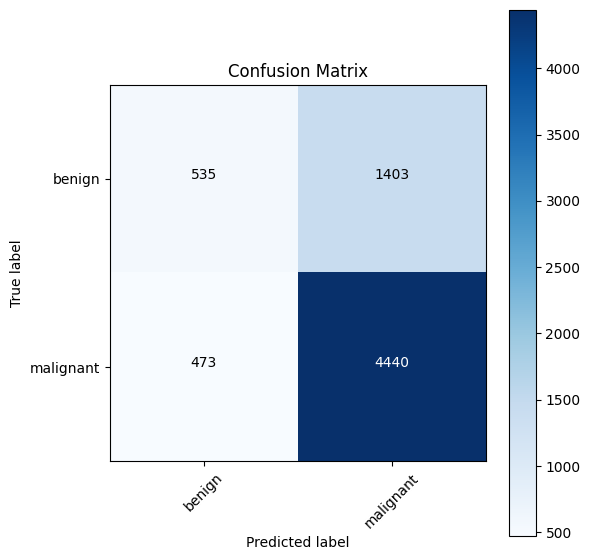

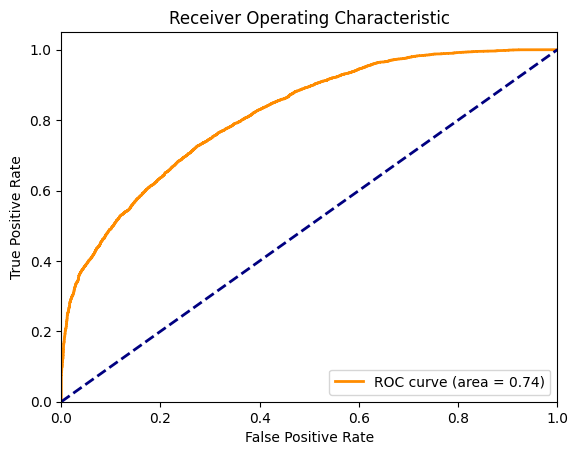

Specificity: 1.0000, Sensitivity: 0.0000, AUC: 0.7369

Test set: Average loss: 0.7441, Accuracy: 4975/6851 (72.62%)



In [89]:
# Assuming model and test_dataloader are already defined and loaded
test_accuracy18, test_loss18, test_auc18 = test(model_res18, test_loader)

In [92]:
# Corrected code to load the model checkpoint
model_res18_epo = Resnet18()  # Replace this with your model class
model_path18_epo = '/kaggle/input/res18-lsast-epoch/pytorch/default/1/resnet18_epoch_26.pth'  # Path to your saved model
model_res18_epo.load_state_dict(torch.load(model_path18_epo))  # Load the model state dict
model_res18_epo.eval()  # Set the model to evaluation mode

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/tmp/ipykernel_30/2198659192.py:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more detail

Resnet18(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)


In [94]:
# Check if CUDA is available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Move the model to the selected device (GPU or CPU)
model_res18_epo = model_res18_epo.to(device)

# Assuming test_loader is your test dataloader
model.eval()  # Set the model to evaluation mode

# Iterate through the test dataset
for data, target in test_loader:
    data, target = data.to(device), target.to(device)  # Move data to the same device as the model
    
    # Get the model's output
    output = model_res18_epo(data)
    # Perform your evaluation here (e.g., calculating loss, accuracy, etc.)

              precision    recall  f1-score   support

      benign     0.5876    0.2250    0.3254      1938
   malignant     0.7541    0.9377    0.8360      4913

    accuracy                         0.7361      6851
   macro avg     0.6709    0.5813    0.5807      6851
weighted avg     0.7070    0.7361    0.6915      6851



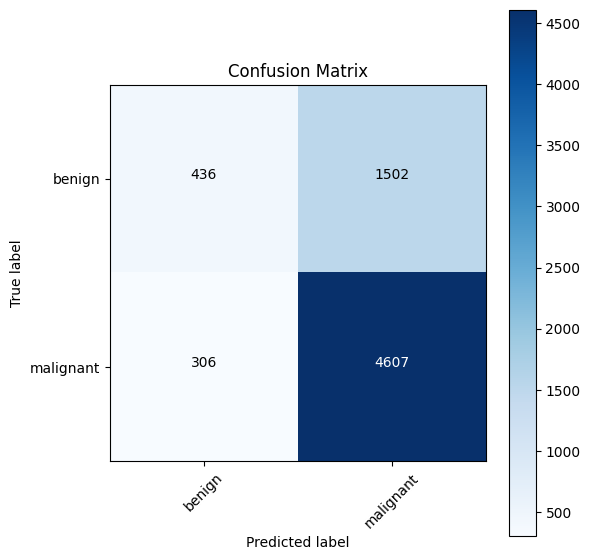

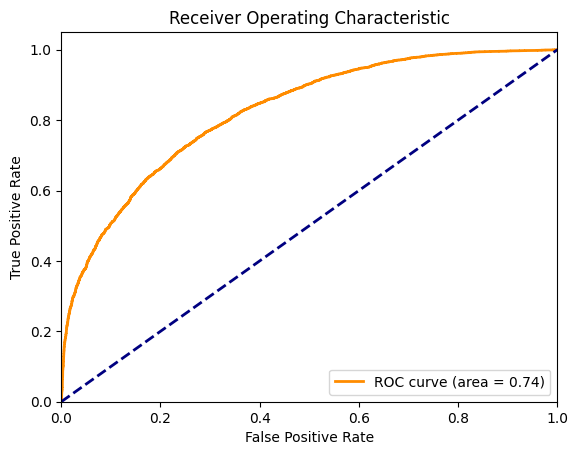

Specificity: 1.0000, Sensitivity: 0.0000, AUC: 0.7382

Test set: Average loss: 0.7913, Accuracy: 5043/6851 (73.61%)



In [95]:
# Assuming model and test_dataloader are already defined and loaded
test_accuracy18epo, test_loss18epo, test_auc18epo = test(model_res18_epo, test_loader)

In [2]:
pip install gradio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.1/57.1 MB 33.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 320.1/320.1 kB 19.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.9/94.9 kB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.1/11.1 MB 100.5 MB/s eta 0:00:0000:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.2/73.2 kB 5.3 MB/s eta 0:00:00
  Attempting uninstall: tomlkit
    Found existing installation: tomlkit 0.13.2
    Uninstalling tomlkit-0.13.2:
      Successfully uninstalled tomlkit-0.13.2
  Attempting uninstall: python-multipart
    Found existing installation: python-multipart 0.0.9
    Uninstalling python-multipart-0.0.9:
      Successfully uninstalled python-multipart-0.0.9
  Attempting uninstall: starlette
    Found existing installation: starlette 0.37.2
    Uninstalling starlette-0.37.2:
      Successfully uninstalled starlette-0.37.2
  Attempting uninstall: fastapi
    Found existing installation: f

In [12]:
import gradio as gr
import torch
from torchvision import transforms, models
from PIL import Image

# Load VGG16 model
vgg16_model = my_model()  # Your custom model class for VGG16
vgg16_model.load_state_dict(torch.load('/kaggle/input/vgg16-best/pytorch/default/1/vgg16_best (2).pth'))
vgg16_model.eval()

# Load ResNet-18 model
resnet18_model = Resnet18()  # Your custom model class for ResNet-18
resnet18_model.load_state_dict(torch.load('/kaggle/input/resnet-18/pytorch/default/1/resnet18_best.pth'))  # Path to ResNet-18 weights
resnet18_model.eval()

# Load ResNet-50 model
resnet50_model = Resnet50()  # Your custom model class for ResNet-50
resnet50_model.load_state_dict(torch.load('/kaggle/input/resnet50/pytorch/default/1/resnet50_best LATEST.pth'))  # Path to ResNet-50 weights
resnet50_model.eval()

# Define a transform (resize, normalize, etc.)
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Adjust to your model input size
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalization used during training
])

# Prediction function
def predict(image, model_name):
    # Select model based on user input
    if model_name == "VGG16":
        model = vgg16_model
    elif model_name == "ResNet-18":
        model = resnet18_model
    elif model_name == "ResNet-50":
        model = resnet50_model
    else:
        return {"Error": "Invalid model selected."}, "Invalid model selected."

    # Preprocess the image
    image = transform(image).unsqueeze(0)  # Add batch dimension

    # Perform inference
    with torch.no_grad():
        output = model(image)
        probabilities = torch.softmax(output, dim=1).squeeze().tolist()

    # Create results
    class_probabilities = {"Benign": probabilities[0], "Malignant": probabilities[1]}
    prediction = "Malignant" if probabilities[1] > probabilities[0] else "Benign"

    return class_probabilities, prediction

# Custom CSS for colors and style
custom_css = """
body {background-color: #f0f8ff;}
h1, h2, h3, h4, h5, h6 {color: #4caf50;}
label {color: #3f51b5;}
.gr-button {background-color: #ff5722 !important; color: white !important;}
.gr-text-input, .gr-file-upload, .gr-dropdown {border: 2px solid #4caf50;}
.gr-text-input:focus, .gr-dropdown:focus {border-color: #3f51b5;}
.gr-output {color: #ff5722;}
"""

# Create the Gradio interface
iface = gr.Interface(
    fn=predict,
    inputs=[
        gr.Image(type="pil", label="Upload Image"),
        gr.Dropdown(["VGG16", "ResNet-18", "ResNet-50"], label="Choose Model")
    ],
    outputs=[
        gr.Label(label="Class Probabilities"),
        gr.Textbox(label="Prediction")
    ],
    title="Tumor Classification Tool",
    description=(
        "Upload an image of a tumor and select a model to classify it as Benign or Malignant. "
        "The interface provides class probabilities and the final prediction."
    ),
    theme="compact",
    css=custom_css
)

# Launch the interface
iface.launch()

/tmp/ipykernel_30/52567848.py:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  vgg16_model.load_state_dict(torch.load('/kaggle/input/vgg16-best/pytorch/default/1/vgg16_best 

* Running on local URL:  http://127.0.0.1:7860
Kaggle notebooks require sharing enabled. Setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

* Running on public URL: https://db3557a12c86d940ed.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)
